<div style="color: rgba(14, 90, 132, 1); vertical-align:middle; text-align: center; font-family: Montserrat;">
    <div style="font-size: 40px; font-weight: bold;">
        Análise do Comércio Exterior
    </div>
    <img src="https://solaris-mh8n.onrender.com/static/img/logo_solaris3.png" align="middle" width="30%" height="30%"/>
    <div style="font-size: 20px; font-style: italic; font-family: Montserrat;">
        SOLARIS SISTEMAS <br /> - SS -
    </div>
</div>

<div style="color: rgba(14, 90, 132, 1); vertical-align:middle; text-align: left;font-family: Montserrat;">
    <div style="font-size: 20px; font-weight: bold;">
        Fonte de Dados
    </div>
    <div style="font-size: 15px; text-weigh: normal; text-align: justify; text-justify: inter-word;">
        O conjunto de dados é disponivilizado através do link <a href="https://www.gov.br/produtividade-e-comercio-exterior/pt-br/assuntos/comercio-exterior/estatisticas/base-de-dados-bruta">https://www.gov.br/produtividade-e-comercio-exterior/pt-br/assuntos/comercio-exterior/estatisticas/base-de-dados-bruta</a>.
    </div>
    <div style="font-size: 15px; text-weigh: normal; text-align: center; text-justify: inter-word;">
       <img src="https://www.basis.com.br/wp-content/uploads/2021/04/thumb-logo-mdic-comex-stat.png" align="middle" width="10%" height="10%"/>
    </div>
</div>

<div style="color: rgba(14, 90, 132, 1); vertical-align:middle; text-align: left;font-family: Montserrat;">
    <div style="font-size: 20px; font-weight: bold;">
        Visualização dos Dados
    </div>
    <div style="font-size: 15px; text-weigh: normal; text-align: justify; text-justify: inter-word;">
        Gráficos para ajudar na compreenssão do conjunto de dados.
    </div>
</div>

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import numpy as np
import plotly.graph_objs as go
import plotly.io as pio
import locale

from sqlalchemy import create_engine, text
from matplotlib.font_manager import FontProperties
from IPython.display import HTML, display
from datetime import datetime

pio.renderers.default = 'iframe'
warnings.filterwarnings("ignore")
%matplotlib inline
locale.setlocale(locale.LC_ALL, 'pt_BR.utf8')

'pt_BR.utf8'

In [23]:
data_atual = datetime.now()
data_formatada = data_atual.strftime("%d de %B de %Y")
m = data_atual.strftime("%B").capitalize()[:3]
print(m)

Out


In [3]:
ano_ref = datetime.now().year
ano_ant = ano_ref-1
mes_acesso = datetime.now().strftime("%B").capitalize()
print(ano_ref, ano_ant, mes_acesso)
url_exp = 'https://balanca.economia.gov.br/balanca/bd/comexstat-bd/mun/IMP_2024_MUN.csv'

2024 2023 Outubro


In [3]:
# Funções uteís para tratamento de números

fmt=lambda x: "{:,.2f}".format(x).replace(",", "X").replace(".", ",").replace("X", ".")
fmti=lambda x: "{:,.0f}".format(x).replace(",", "X").replace(".", ",").replace("X", ".")

In [6]:
%%time

exportacao = pd.read_csv(url_exp, sep=';')

CPU times: total: 578 ms
Wall time: 26.2 s


In [10]:
exportacao.shape

(1288980, 8)

In [7]:
exportacao.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1288980 entries, 0 to 1288979
Data columns (total 8 columns):
 #   Column      Non-Null Count    Dtype 
---  ------      --------------    ----- 
 0   CO_ANO      1288980 non-null  int64 
 1   CO_MES      1288980 non-null  int64 
 2   SH4         1288980 non-null  int64 
 3   CO_PAIS     1288980 non-null  int64 
 4   SG_UF_MUN   1288980 non-null  object
 5   CO_MUN      1288980 non-null  int64 
 6   KG_LIQUIDO  1288980 non-null  int64 
 7   VL_FOB      1288980 non-null  int64 
dtypes: int64(7), object(1)
memory usage: 78.7+ MB


In [26]:
print(exportacao.CO_ANO.min(), exportacao.CO_MES.min(), 1)
print(exportacao.CO_ANO.max(), exportacao.CO_MES.max(), 1)

2024 1 1
2024 9 1


In [28]:
# print(exportacao.CO_MES.min(), exportacao.CO_MES.max())

data_min = datetime(exportacao.CO_ANO.min(), exportacao.CO_MES.min(), 1)
data_max = datetime(exportacao.CO_ANO.max(), exportacao.CO_MES.max(), 1)
#data_formatada = data_atual.strftime("%d de %B de %Y")
m1 = data_min.strftime("%B").capitalize()[:3]
m2 = data_max.strftime("%B").capitalize()[:3]
print(m1, m2)


Jan Set


In [5]:
%%time

####################################################################### SQlite

conn = Connection()
engine = create_engine(conn.current)
try:
    sql = """
            with data as (select max(mes) mes_atu, max(ano) ano_atu , max(ano)-1 ano_ant
                            from exportacao 
                           where ano = strftime('%Y', date('now'))
                           ),
                 impo_atu as (select i.cod_muni, m.nom_muni, m.uf,sum(i.vl_fob) valor, count(*) as qtd
                                from importacao i
                               inner join municipio m on (i.cod_muni = m.cod_muni) 
                               inner join data d on (i.ano = d.ano_atu)
                               group by i.cod_muni, m.nom_muni, m.uf), 
                 impo_ant as (select i.cod_muni, m.nom_muni, m.uf,sum(i.vl_fob) valor, count(*) as qtd
                                from importacao i
                               inner join municipio m on (i.cod_muni = m.cod_muni) 
                               inner join data d on (i.ano = d.ano_ant and i.mes <= d.mes_atu)
                               group by i.cod_muni, m.nom_muni, m.uf),
                 expo_atu as (select e.cod_muni, m.nom_muni, m.uf,sum(e.vl_fob) valor, count(*) as qtd
                                from exportacao e
                               inner join municipio m on (e.cod_muni = m.cod_muni) 
                               inner join data d on (e.ano = d.ano_atu)
                               group by e.cod_muni, m.nom_muni, m.uf),
                 expo_ant as (select e.cod_muni, m.nom_muni, m.uf,sum(e.vl_fob) valor, count(*) as qtd
                                from exportacao e
                               inner join municipio m on (e.cod_muni = m.cod_muni) 
                               inner join data d on (e.ano = d.ano_ant and e.mes <= d.mes_atu)
                               group by e.cod_muni, m.nom_muni, m.uf),
                 imp_rank_pais as (select m.cod_muni, m.uf, sum(i.vl_fob) valor, count(*) as qtd
                                     from importacao i
                                    inner join municipio m on (i.cod_muni = m.cod_muni) 
                                    inner join data d on (i.ano = d.ano_atu)
                                    group by m.cod_muni, m.uf), 
                 exp_rank_pais as (select m.cod_muni, m.uf, sum(e.vl_fob) valor 
                                     from exportacao e
                                    inner join municipio m on (e.cod_muni = m.cod_muni) 
                                    inner join data d on (e.ano = d.ano_atu)
                                    group by m.cod_muni, m.uf),
                 exp_rank_estado as (select * from exp_rank_pais where uf = 'SP'),
                 exp_rank_pf as (select *, rank() over(order by valor desc) as rank from exp_rank_pais),
                 exp_rank_ef as (select *, rank() over(order by valor desc) as rank from exp_rank_estado),
                 imp_rank_estado as (select * from imp_rank_pais where uf = 'SP'),
                 imp_rank_pf as (select *, rank() over(order by valor desc) as rank from imp_rank_pais),
                 imp_rank_ef as (select *, rank() over(order by valor desc) as rank from imp_rank_estado)
            select round((select sum(e.valor)/1000000. from expo_atu e where e.cod_muni = 3418800), 2) as exp,
                   (round((select sum(e.valor) from expo_atu e where e.cod_muni = 3418800)/(select cast(sum(e.valor) as float) from expo_ant e where e.cod_muni = 3418800), 4)-1)*100 as var_exp,
                   round((select sum(i.valor)/1000000. from impo_atu i where i.cod_muni = 3418800), 2) as imp,
                   (round((select sum(e.valor) from impo_atu e where e.cod_muni = 3418800)/(select cast(sum(e.valor) as float) from impo_ant e where e.cod_muni = 3418800), 4)-1)*100 as var_imp,       
                   round(((select sum(e.valor)/1000000. from expo_atu e where e.cod_muni = 3418800) + (select sum(i.valor)/1000000. from impo_atu i where i.cod_muni = 3418800)), 2) as corrente,
                   round(((
                        ((select cast(sum(e.valor) as float) from expo_atu e where e.cod_muni = 3418800) + (select cast(sum(i.valor) as float) from impo_atu i where i.cod_muni = 3418800))/
                        ((select cast(sum(e.valor) as float) from expo_ant e where e.cod_muni = 3418800) + (select cast(sum(i.valor) as float) from impo_ant i where i.cod_muni = 3418800))
                   )-1)*100, 1) as var_corr,
                   round(((select sum(e.valor)/1000000. from expo_atu e where e.cod_muni = 3418800) - (select sum(i.valor)/1000000. from impo_atu i where i.cod_muni = 3418800)), 2) as saldo,
                   round(((select sum(valor) from expo_atu where cod_muni = 3418800) / (select cast(sum(valor) as float) from expo_atu where uf = 'SP')) * 100., 1) as part_exp_estado,
                   round(((select sum(valor) from expo_atu where cod_muni = 3418800) / (select cast(sum(valor) as float) from expo_atu)) * 100, 1) as part_exp_brasil,
                   (select rank from exp_rank_ef where cod_muni = 3418800) rank_exp_estado,
                   (select rank from exp_rank_pf where cod_muni = 3418800) rank_exp_brasil,
                   round(((select sum(valor) from impo_atu where cod_muni = 3418800) / (select cast(sum(valor) as float) from impo_atu where uf = 'SP')) * 100., 1) as part_imp_estado,
                   round(((select sum(valor) from impo_atu where cod_muni = 3418800) / (select cast(sum(valor) as float) from impo_atu)) * 100., 1) as part_imp_brasil,
                   (select rank from imp_rank_ef where cod_muni = 3418800) rank_imp_estado,
                   (select rank from imp_rank_pf where cod_muni = 3418800) rank_imp_brasil;
        """
    df = pd.read_sql(text(sql), con = engine.connect())
except Exception as e:
    print(str(e))
finally:
    engine.dispose()

CPU times: total: 13.5 s
Wall time: 15.3 s


In [6]:
df

,exp,var_exp,imp,var_imp,corrente,var_corr,saldo,part_exp_estado,part_exp_brasil,rank_exp_estado,rank_exp_brasil,part_imp_estado,part_imp_brasil,rank_imp_estado,rank_imp_brasil
0,978.08,-2.2,1076.79,-8.66,2054.87,-5.7,-98.71,3.2,0.7,7,22,3.6,1.0,8,23


In [7]:
icon_var_exp: str = 'fa-arrow-up'
icon_var_imp: str = 'fa-arrow-up'
icon_var_cor: str = 'fa-arrow-up'
ind_saldo: str = 'Superávit'

if df['var_exp'][0] < 0:
    icon_var_exp = 'fa-arrow-down'
    
if df['var_imp'][0] < 0:
    icon_var_imp = 'fa-arrow-down'
    
if df['var_corr'][0] < 0:
    icon_var_cor = 'fa-arrow-down'
    
if df['saldo'][0] < 0:
    ind_saldo = 'Déficit'


html = """
            <h3 style="color: rgba(14, 90, 132, 1); vertical-align:middle; text-align: center;font-size: 40px; font-weight: bold; font-family: Montserrat;">
                Guarulhos: Exportações, Importações e Balança Comercial
            </h3>
            <h4>{} / {}</h4>

            <table class="table table-sm table-bordered" style="width:1500px;height:200px;font-family: Montserrat;">
                <tbody>
                <tr>
                    <td style="background-color: #2C9D7E; text-align: center;font-size: 20px;">
                        <span><i class="fa fa-expand"></i> Exportações US$ Milhões</span>
                        <br/ ><span style="font-size:40px;font-weight: bold;">{}</span>
                        <br/ ><span><i class="fa {} fa-6"></i>{}% Var. {}
                        <br/ >{}/{}</span>
                    </td>
                    <td style="background-color: #336C9B; text-align: center;font-size: 20px;">
                        <span><i class="fa fa-compress"></i> Importações US$ Milhões</span>
                        <br/ ><span style="font-size:40px;font-weight: bold;">{}</span>
                        <br/ ><span><i class="fa {} fa-6"></i>{}% Var. {}
                        <br/ >{}/{}</span>
                    </td>
                    <td style="background-color: #7E8696; text-align: center;font-size: 20px;">
                        <span><i class="fa fa-plus"></i> Corrente US$ Milhões</span>
                        <br/ ><span style="font-size:40px;font-weight: bold;">{}</span>
                        <br/ ><span><i class="fa {} fa-6"></i>{}% Var. {}
                        <br/ >{}/{}</span>
                    </td>
                    <td style="background-color: #DA925B; text-align: center;font-size: 20px;">
                        <span><i class="fa fa-balance-scale"></i> Saldo US$ Milhões</span>
                        <br/ ><span style="font-size:40px;font-weight: bold;">{}</span>
                        <br/ ><span>{} {}</span>
                        <br/ >{}
                    </td>
                </tr>
                <tr>
                    <td style="text-align: center; font-size: 20px;">
                        <span style="font-size:40px;font-weight: bold;">{}%</span>
                        <br /><i class="fa fa-pie-chart"></i> Part. nas Exportações - Estado
                        <br /><span>{}/{}</span>
                        <hr>
                    </td>
                    <td style="text-align: center; font-size: 20px;">
                        <span style="font-size:40px;font-weight: bold;">{}º</span>
                        <br /><i class="fa fa-star"></i> Rank de Exportações - Estado
                        <br /><span>{}/{}</span>
                        <hr>
                    </td>
                    <td style="text-align: center; font-size: 20px;">
                        <span style="font-size:40px;font-weight: bold;">{}%</span>
                        <br /><i class="fa fa-pie-chart"></i> Part. nas Exportações - Brasil
                        <br /><span>{}/{}</span>
                        <hr>
                    </td>
                    <td style="text-align: center; font-size: 20px;">
                        <span style="font-size:40px;font-weight: bold;">{}º</span>
                        <br /><i class="fa fa-star"></i> Rank de Exportações - Brasil
                        <br /><span>{}/{}</span>
                        <hr>
                    </td>
                </tr>
                <tr>
                    <td style="text-align: center; font-size: 20px;">
                        <span style="font-size:40px;font-weight: bold;">{}%</span>
                        <br /><i class="fa fa-pie-chart"></i> Part. nas Importações - Estado
                        <br /><span>{}/{}</span>
                        <hr>
                    </td>
                    <td style="text-align: center; font-size: 20px;">
                        <span style="font-size:40px;font-weight: bold;">{}º</span>
                        <br /><i class="fa fa-star"></i> Rank de Importações - Estado
                        <br /><span>{}/{}</span>
                        <hr>
                    </td>
                    <td style="text-align: center; font-size: 20px;">
                        <span style="font-size:40px;font-weight: bold;">{}%</span>
                        <br /><i class="fa fa-pie-chart"></i> Part. nas Importações - Brasil
                        <br /><span>{}/{}</span>
                        <hr>
                    </td>
                    <td style="text-align: center; font-size: 20px;">
                        <span style="font-size:40px;font-weight: bold;">{}º</span>
                        <br /><i class="fa fa-star"></i> Rank de Importações - Brasil
                        <br /><span>{}/{}</span>
                        <hr>
                    </td>
                </tr>
                </tbody>
            </table>
            """.format(ref, 
                       ano_ref, 
                       fmt(df['exp'][0]), 
                       icon_var_exp, 
                       fmt(df['var_exp'][0]), 
                       ref, 
                       ano_ref, 
                       ano_ant,
                       fmt(df['imp'][0]), 
                       icon_var_imp, 
                       fmt(df['var_imp'][0]), 
                       ref, 
                       ano_ref, 
                       ano_ant,
                       fmt(df['corrente'][0]), 
                       icon_var_cor, 
                       fmt(df['var_corr'][0]), 
                       ref, 
                       ano_ref, 
                       ano_ant,
                       fmt(df['saldo'][0]), 
                       ind_saldo, 
                       ref, 
                       ano_ref,
                       fmt(df['part_exp_estado'][0]), 
                       ref, 
                       ano_ref,
                       df['rank_exp_estado'][0], 
                       ref, 
                       ano_ref,
                       fmt(df['part_exp_brasil'][0]), 
                       ref, 
                       ano_ref,
                       df['rank_exp_brasil'][0], 
                       ref, 
                       ano_ref,
                       fmt(df['part_imp_estado'][0]), 
                       ref, 
                       ano_ref,
                       df['rank_imp_estado'][0], 
                       ref, 
                       ano_ref,
                       fmt(df['part_imp_brasil'][0]), 
                       ref, 
                       ano_ref,
                       df['rank_imp_brasil'][0], 
                       ref, 
                       ano_ref
                      )
    
HTML(html)

"Exportações US$ Milhões 978,08 -2,20% Var. Jan-Mai 2024/2023","Importações US$ Milhões 1.076,79 -8,66% Var. Jan-Mai 2024/2023","Corrente US$ Milhões 2.054,87 -5,70% Var. Jan-Mai 2024/2023","Saldo US$ Milhões -98,71 Déficit Jan-Mai 2024"
"3,20% Part. nas Exportações - Estado Jan-Mai/2024",7º Rank de Exportações - Estado Jan-Mai/2024,"0,70% Part. nas Exportações - Brasil Jan-Mai/2024",22º Rank de Exportações - Brasil Jan-Mai/2024
"3,60% Part. nas Importações - Estado Jan-Mai/2024",8º Rank de Importações - Estado Jan-Mai/2024,"1,00% Part. nas Importações - Brasil Jan-Mai/2024",23º Rank de Importações - Brasil Jan-Mai/2024


In [8]:
def plot_bar(df, xl, yl, tt, st = None, rt = 30):
    sns.set(style="darkgrid")
    ax = df.plot.bar(figsize=(20, 10))
    plt.figure(figsize=(20, 10))
    for bars in ax.containers:
        ax.bar_label(bars, fmt=lambda x: "{:,.0f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation=rt, fontsize=15)

    ax.set_xlabel(xl, fontsize = 20)
    ax.set_ylabel(yl, fontsize = 20)
    #ax.set_title(tt, fontdict={'fontsize': 25, 'fontweight': 'medium'})
    if st:
        #ax.set_suptitle(st, fontsize=16, fontweight="bold", x=0.126, y=0.96, ha="center")
        ax.set_title(tt + '\n' + st, fontdict={'fontsize': 25, 'fontweight': 'bold'})
    else:
        ax.set_title(tt, fontdict={'fontsize': 25, 'fontweight': 'medium'})

    plt.setp(ax.get_xticklabels(), rotation=rt, ha="right", rotation_mode="anchor", fontsize=15)
    plt.setp(ax.get_yticklabels(), rotation=0, ha="right", rotation_mode="anchor", fontsize=15)
    return plt.show()

In [9]:
def plot_bar2(df, xl, yl, tt, st = None, rt = 30):
    plt.figure(figsize=(20, 10))
    sns.set(style="darkgrid")
    ax = sns.barplot(data=df, x=xl, y=yl)
    for bars in ax.containers:
        ax.bar_label(bars, fmt=lambda x: "{:,.2f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation = rt, fontsize=15)
        
    ax.set_xlabel(xl, fontsize = 20)
    ax.set_ylabel(yl, fontsize = 20)
    plt.title(tt + '\n\n', size = 30)
    plt.xticks(rotation = rt, fontsize=17)
    return plt.show()

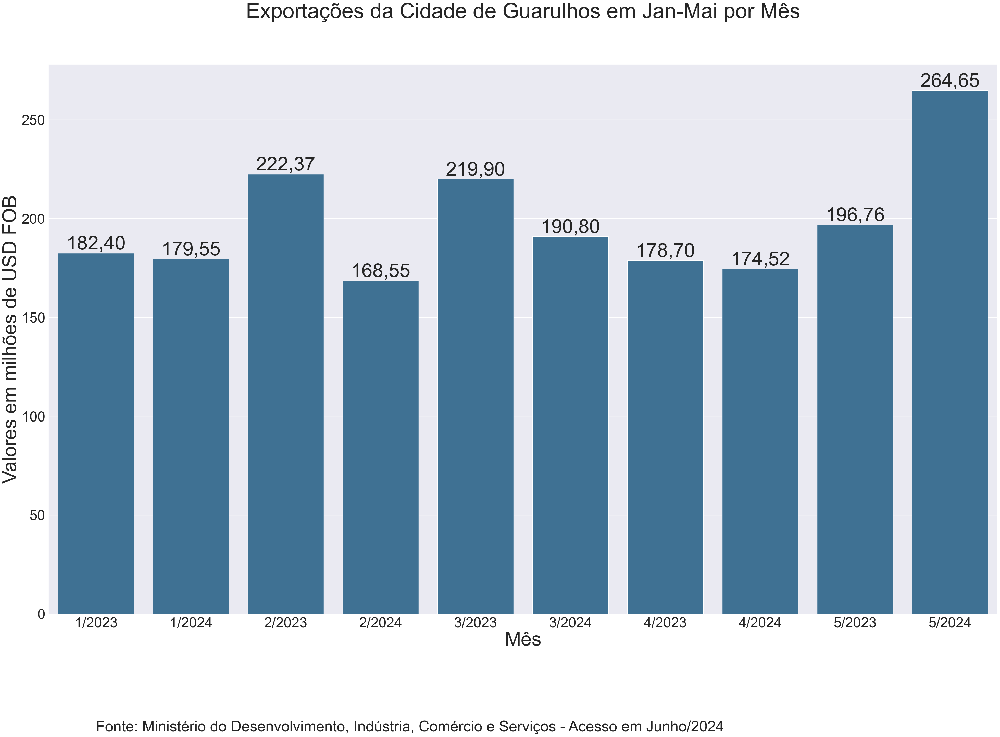

CPU times: total: 578 ms
Wall time: 565 ms


In [10]:
%%time

conn = Connection()
engine = create_engine(conn.current)
try:
    sql = """
        select sum(e.vl_fob) val, e.mes || '/' || e.ano ref, e.ano, e.mes
         from exportacao e 
        where e.cod_muni = 3418800 and e.ano in({}, {})
        and e.mes <= (select max(mes) from exportacao where ano = {})
        group by e.mes || '/' || e.ano, e.ano, e.mes
        order by 4, 3;
    """.format(ano_ant, ano_ref, ano_ref)
    df = pd.read_sql(text(sql), con = engine.connect())
except Exception as e:
    print(str(e))
finally:
    engine.dispose()
    
df['val'] = df['val'].apply(lambda x : x/1000000)
    
#plot_bar2(df, 'Ano', 'Valor US$', 'Exportações da Cidade de Guarulhos\n')

cols = ['#E1812B' if x == 2022 else '#3174A1' for x in df.ano]
# cols = ['blue', 'blue', 'green', 'green', 'brown', 'brown', 'gray', 'gray', 'orange', 'orange']


plt.figure(figsize=(48, 28))
sns.set(style="darkgrid")
ax = sns.barplot(data=df.sort_values(by='ref', ascending=True), x='ref', y='val', palette=cols)
for bars in ax.containers:
    ax.bar_label(bars, fmt=lambda x: "{:,.2f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation = 0, fontsize=55)

ax.set_xlabel('Mês', rotation=0, fontsize = 55)
ax.set_ylabel('Valores em milhões de USD FOB', fontsize = 55)
plt.title('Exportações da Cidade de Guarulhos em {} por Mês\n\n'.format(ref), size = 60)
plt.text(0, -1.2, "\n\n\n\n\n\n\n\n\n\n\n\n\n\nFonte: Ministério do Desenvolvimento, Indústria, Comércio e Serviços - Acesso em {}/{}".format(acesso, ano_ref), ha='left', va='center', fontsize=42)
plt.xticks(rotation = 0, fontsize=40)
plt.yticks(rotation = 0, fontsize=40)
plt.show()


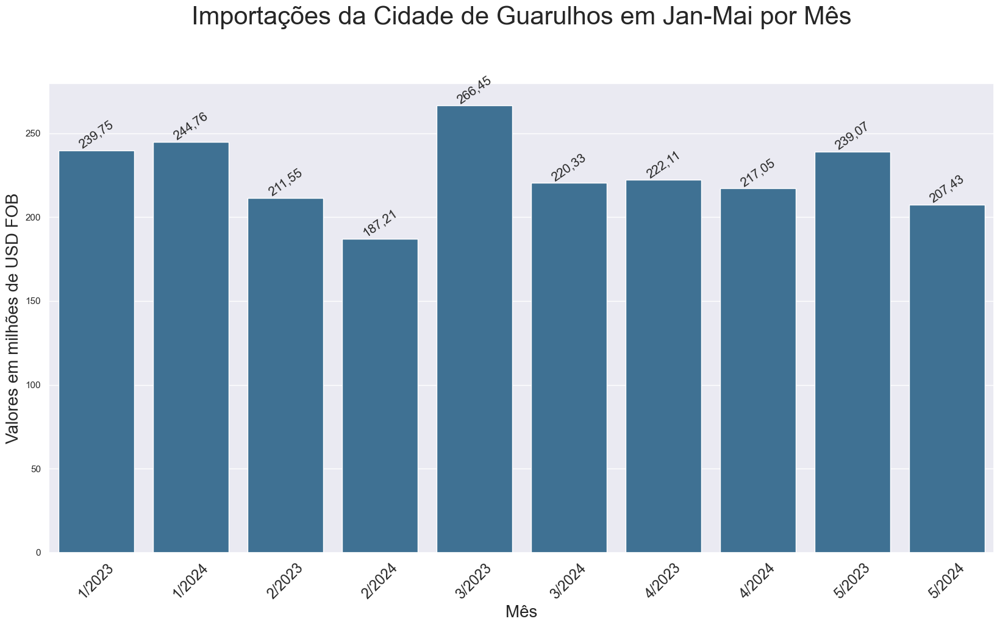

CPU times: total: 344 ms
Wall time: 355 ms


In [11]:
%%time

conn = Connection()
engine = create_engine(conn.current)
try:
    sql = """
        select i.mes, i.ano, sum(i.vl_fob) val, i.mes || '/' || i.ano ref
         from importacao i 
        where i.cod_muni = 3418800 and i.ano in({}, {})
        and i.mes <= (select max(mes) from importacao where ano = {})
        group by i.mes, i.ano, i.mes || '/' || i.ano
        order by 1, 2;
    """.format(ano_ant, ano_ref, ano_ref)
    imp = pd.read_sql(text(sql), con = engine.connect())
except Exception as e:
    print(str(e))
finally:
    engine.dispose()
    
imp['val'] = imp['val'].apply(lambda x : x/1000000)
    
#plot_bar2(df, 'Ano', 'Valor US$', 'Exportações da Cidade de Guarulhos\n')

cols = ['#E1812B' if x == 2022 else '#3174A1' for x in imp.ano]
# cols = ['blue', 'blue', 'green', 'green', 'brown', 'brown', 'gray', 'gray', 'orange', 'orange']

plt.figure(figsize=(20, 10))
sns.set(style="darkgrid")
ax = sns.barplot(data=imp.sort_values(by='ref', ascending=True), x='ref', y='val', palette=cols)
for bars in ax.containers:
    ax.bar_label(bars, fmt=lambda x: "{:,.2f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation = 35, fontsize=15)

ax.set_xlabel('Mês', fontsize = 20)
ax.set_ylabel('Valores em milhões de USD FOB', fontsize = 20)
plt.title('Importações da Cidade de Guarulhos em {} por Mês\n\n'.format(ref), size = 30)
#plt.text(4.8, -1.2, "\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\nFonte: Ministério do Desenvolvimento, Indústria, Comércio e Serviços - Acesso em {}/{}".format(acesso, ano_ref), ha='left', va='center', fontsize=12)
plt.xticks(rotation = 45, fontsize=17)
plt.show()

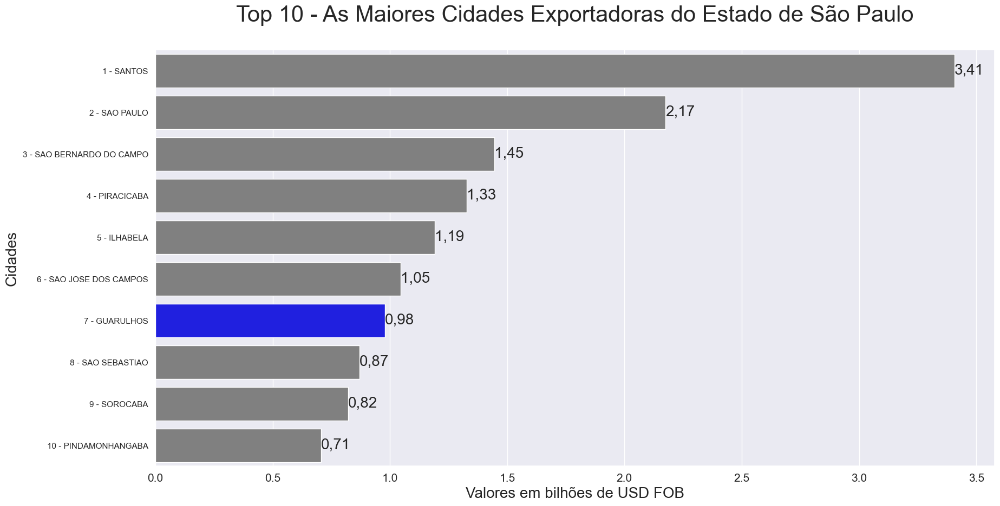

CPU times: total: 328 ms
Wall time: 334 ms


In [12]:
%%time

conn = Connection()
engine = create_engine(conn.current)
try:
    sql = """
        with t as (select m.nom_muni as "Cidade", sum(e.vl_fob) as "Valor US$"
                      from exportacao e 
                     inner join municipio m on (e.cod_muni = m.cod_muni) 
                     inner join produto pd on (e.cod_produto = pd.cod_produto) 
                     inner join pais p on (e.cod_pais = p.cod_pais) 
                     where e.ano = {} 
                       and e.sg_uf_mun = 'SP'
                    group by m.nom_muni
                    order by 2 desc limit 10)
        select RANK () OVER (ORDER BY t."Valor US$" DESC) rank, t.* from t;
    """.format(ano_ref)
    expcid = pd.read_sql(text(sql), con = engine.connect())
except Exception as e:
    print(str(e))
finally:
    engine.dispose()
    
expcid['Valor US$'] = expcid['Valor US$'].apply(lambda x : x/1000000000)
expcid['classcidade'] = expcid['rank'].astype(str) + ' - ' + expcid['Cidade']

plt.figure(figsize=(20, 10))
sns.set(style="darkgrid")

cols = ['blue' if x == 'GUARULHOS' else 'gray' for x in expcid.Cidade]

ax = sns.barplot(data=expcid, y='classcidade', x='Valor US$', palette=cols)
for bars in ax.containers:
    ax.bar_label(bars, fmt=lambda x: "{:,.2f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation = 0, fontsize=20)

ax.set_ylabel('Cidades', fontsize = 20)
ax.set_xlabel('Valores em bilhões de USD FOB', fontsize = 20)
plt.title('Top 10 - As Maiores Cidades Exportadoras do Estado de São Paulo\n'.format(ref), size = 30)
#plt.text(1.2, 9.5, "\n\n\n\n\n\n\n\n\n\n\nFonte: Ministério do Desenvolvimento, Indústria, Comércio e Serviços - Acesso em {}/{}".format(acesso, ano_ref), ha='left', va='center', fontsize=12)
plt.xticks(rotation = 0, fontsize=15)
plt.show()


In [11]:
expcid

,rank,Cidade,Valor US$,classcidade
0,1,SANTOS,3.407504,1 - SANTOS
1,2,SAO PAULO,2.174524,2 - SAO PAULO
2,3,SAO BERNARDO DO CAMPO,1.445975,3 - SAO BERNARDO DO CAMPO
3,4,PIRACICABA,1.327226,4 - PIRACICABA
4,5,ILHABELA,1.191084,5 - ILHABELA
5,6,SAO JOSE DOS CAMPOS,1.045947,6 - SAO JOSE DOS CAMPOS
6,7,GUARULHOS,0.978078,7 - GUARULHOS
7,8,SAO SEBASTIAO,0.870363,8 - SAO SEBASTIAO
8,9,SOROCABA,0.822349,9 - SOROCABA
9,10,PINDAMONHANGABA,0.706528,10 - PINDAMONHANGABA


In [24]:
%%time

conn = Connection()
engine = create_engine(conn.current)
try:
    sql = """
        with t as (select m.nom_muni as "Cidade", sum(e.vl_fob) as "Valor US$"
                      from exportacao e 
                     inner join municipio m on (e.cod_muni = m.cod_muni) 
                     inner join produto pd on (e.cod_produto = pd.cod_produto) 
                     inner join pais p on (e.cod_pais = p.cod_pais) 
                     where e.ano = {} 
                       and e.sg_uf_mun = 'SP'
                    group by m.nom_muni
                    order by 2 desc limit 10)
        select RANK () OVER (ORDER BY t."Valor US$" DESC) rank, t.* from t order by 1 desc;
    """.format(ano_ref)
    df = pd.read_sql(text(sql), con = engine.connect())
except Exception as e:
    print(str(e))
finally:
    engine.dispose()
    
df['Valor US$'] = df['Valor US$'].apply(lambda x : x/1000000000)
df['classcidade'] = df['rank'].astype(str) + ' - ' + df['Cidade']

cols = ['blue' if x == 'GUARULHOS' else 'gray' for x in df.Cidade]

barra = go.Bar(x=df['Valor US$'], 
               y=df['classcidade'], 
               marker={'color': cols}, 
               text=df['Valor US$'].apply(lambda x: fmt(x)), 
               hovertext=df['Valor US$'], 
               textposition='auto',
               orientation='h')
data = [barra]
titulo = "Top 10 - As Maiores Cidades Exportadoras do Estado de São Paulo\n"
layout = go.Layout(title=titulo, 
                   xaxis={'title': 'Valores em bilhões de USD FOB <br /><i>Fonte: COMEX - Acesso em {}</i>'.format(acesso)}, 
                   yaxis={'title': 'Cidades'}, 
                   font=dict(family="Montserrat", size=17, color="darkblue"))
fig = go.Figure(data=data, layout=layout)
fig.update_xaxes(nticks=12)
fig.update_layout(title=go.layout.Title(text=titulo, font=dict(family="Montserrat", size=25, color="darkblue")), title_x=0.5)
fig.update_layout(autosize=False, width=1250,height=500, template = 'simple_white')
fig.show()

CPU times: total: 359 ms
Wall time: 1.61 s


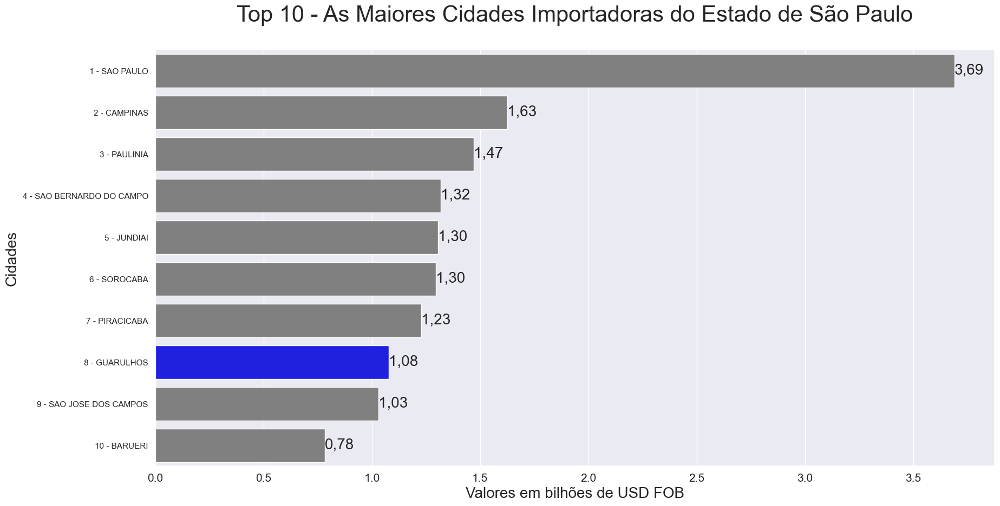

CPU times: total: 438 ms
Wall time: 472 ms


In [13]:
%%time

conn = Connection()
engine = create_engine(conn.current)
try:
    sql = """
        with t as (select m.nom_muni as "Cidade", sum(i.vl_fob) as "Valor US$"
                    from importacao i
                    inner join municipio m on (i.cod_muni = m.cod_muni) 
                    inner join produto pd on (i.cod_produto = pd.cod_produto) 
                    inner join pais p on (i.cod_pais = p.cod_pais) 
                    where i.ano = {}
                      and i.sg_uf_mun = 'SP'
                    group by m.nom_muni
                    order by 2 desc limit 10)
            select RANK () OVER (ORDER BY t."Valor US$" DESC) rank, t.* from t;
    """.format(ano_ref)
    impcid = pd.read_sql(text(sql), con = engine.connect())
except Exception as e:
    print(str(e))
finally:
    engine.dispose()
    
impcid['Valor US$'] = impcid['Valor US$'].apply(lambda x : x/1000000000)
impcid['classcidade'] = impcid['rank'].astype(str) + ' - ' + impcid['Cidade']

plt.figure(figsize=(20, 10))
sns.set(style="darkgrid")

cols = ['blue' if x == 'GUARULHOS' else 'gray' for x in impcid.Cidade]

ax = sns.barplot(data=impcid, y='classcidade', x='Valor US$', palette=cols)
for bars in ax.containers:
    ax.bar_label(bars, fmt=lambda x: "{:,.2f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation = 0, fontsize=20)

ax.set_ylabel('Cidades', fontsize = 20)
ax.set_xlabel('Valores em bilhões de USD FOB', fontsize = 20)
plt.title('Top 10 - As Maiores Cidades Importadoras do Estado de São Paulo\n'.format(ref), size = 30)
#plt.text(1.2, 9.5, "\n\n\n\n\n\n\n\n\n\n\nFonte: Ministério do Desenvolvimento, Indústria, Comércio e Serviços - Acesso em {}/{}".format(acesso, ano_ref), ha='left', va='center', fontsize=12)
plt.xticks(rotation = 0, fontsize=15)
plt.show()

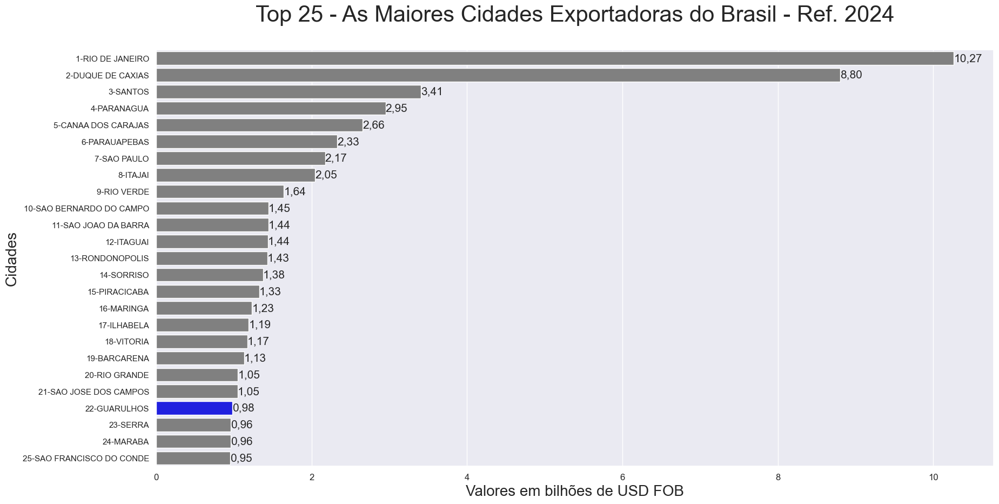

CPU times: total: 578 ms
Wall time: 587 ms


In [14]:
%%time

conn = Connection()
engine = create_engine(conn.current)
try:
    sql = """
        with t as (select m.nom_muni as "Cidade", sum(e.vl_fob) as "Valor US$"
                     from exportacao e 
                    inner join municipio m on (e.cod_muni = m.cod_muni) 
                    inner join produto pd on (e.cod_produto = pd.cod_produto) 
                    inner join pais p on (e.cod_pais = p.cod_pais) 
                    where e.ano = {}
                    group by m.nom_muni
                    order by 2 desc limit 25)
            select RANK () OVER (ORDER BY t."Valor US$" DESC) rank, t.* from t;
    """.format(ano_ref)
    bra = pd.read_sql(text(sql), con = engine.connect())
except Exception as e:
    print(str(e))
finally:
    engine.dispose()
    
bra['Valor US$'] = bra['Valor US$'].apply(lambda x : x/1000000000)
bra['classcidade'] = bra['rank'].astype(str) + '-' + bra['Cidade']

plt.figure(figsize=(20, 10))
sns.set(style="darkgrid")

cols = ['blue' if x == 'GUARULHOS' else 'gray' for x in bra.Cidade]

ax = sns.barplot(data=bra, y='classcidade', x='Valor US$', palette=cols)
for bars in ax.containers:
    ax.bar_label(bars, fmt=lambda x: "{:,.2f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation = 0, fontsize=15)

ax.set_ylabel('Cidades', fontsize = 20)
ax.set_xlabel('Valores em bilhões de USD FOB', fontsize = 20)
plt.title('Top 25 - As Maiores Cidades Exportadoras do Brasil - Ref. {}\n'.format(ano_ref), size = 30)
#plt.text(5, 28, "Fonte: Ministério do Desenvolvimento, Indústria, Comércio e Serviços - Acesso em {}/{}".format(acesso, ano_ref), ha='left', va='center', fontsize=12)
plt.xticks(rotation = 0, fontsize=12)
plt.show()

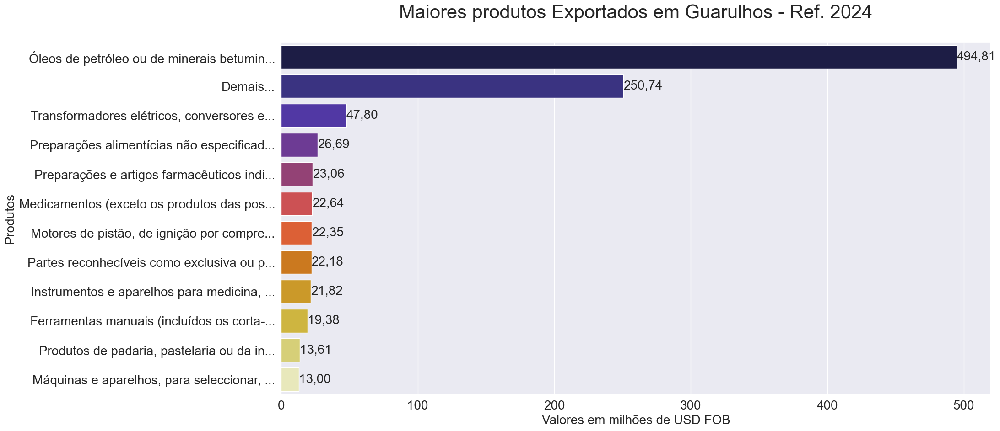

CPU times: total: 672 ms
Wall time: 673 ms


In [15]:
%%time

conn = Connection()
engine = create_engine(conn.current)
try:
    sql = """
        with t as (select pd.cod_produto, pd.nom_produto, sum(e.vl_fob) valor
                     from exportacao e 
                    inner join municipio m on (e.cod_muni = m.cod_muni) 
                    inner join produto pd on (e.cod_produto = pd.cod_produto) 
                    inner join pais p on (e.cod_pais = p.cod_pais) 
                    where e.ano = {}
                      and e.sg_uf_mun = 'SP' 
                      and e.cod_muni = 3418800 
                    group by pd.cod_produto, pd.nom_produto
                    order by 3 desc),
             rnk as (select RANK () OVER (ORDER BY t.valor DESC) rank, t.* from t),
             tot as (select case when rank > 11 /*or r.cod_produto = 2710*/ then 11 else rank end rank, 
                            case when rank > 11 /*or r.cod_produto = 2710*/ then 'Demais' else r.nom_produto end dsc_produto, 
                            valor 
                       from rnk r),
             trat as (select rank, substring(dsc_produto, 1, 40) || '...' as dsc_produto, valor from tot)
        select rank, dsc_produto as produto, sum(valor) as valor from trat group by rank, dsc_produto order by 1;
    """.format(ano_ref)
    df3 = pd.read_sql(text(sql), con = engine.connect())
except Exception as e:
    print(str(e))
finally:
    engine.dispose()
    

df3['valor'] = df3['valor'].apply(lambda x : x/1000000)

plt.figure(figsize=(20, 10))
sns.set(style="darkgrid")

ax = sns.barplot(data=df3.sort_values(by='valor', ascending=False), y='produto', x='valor', palette='CMRmap')
for bars in ax.containers:
    ax.bar_label(bars, fmt=lambda x: "{:,.2f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation = 0, fontsize=20)

ax.set_ylabel('Produtos', fontsize = 20)
ax.set_xlabel('Valores em milhões de USD FOB', fontsize = 20)
plt.title('Maiores produtos Exportados em Guarulhos - Ref. {}\n'.format(ano_ref), size = 30)
#plt.text(8, 13, "Fonte: Ministério do Desenvolvimento, Indústria, Comércio e Serviços - Acesso em {}/{}".format(acesso, ano_ref), ha='left', va='center', fontsize=12)
plt.xticks(rotation = 0, fontsize=20)
plt.yticks(rotation = 0, fontsize=20)
plt.show()

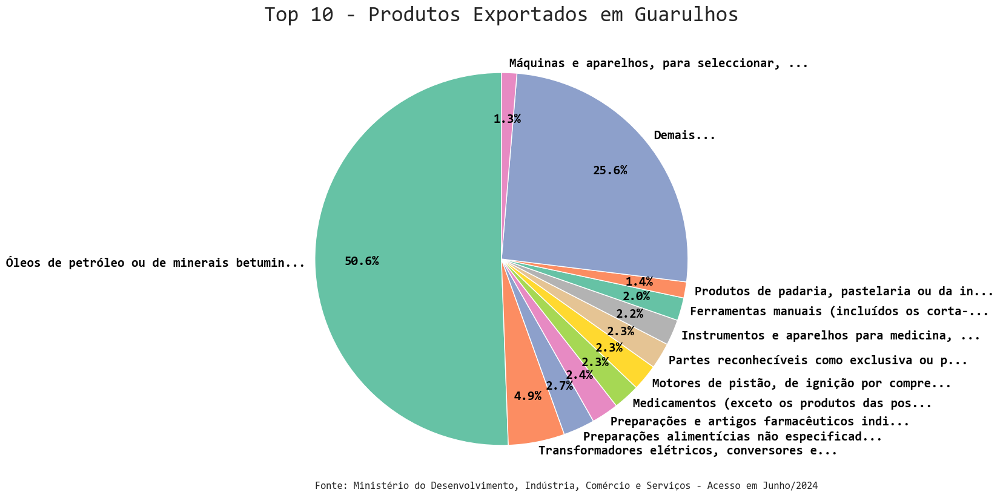

In [16]:
plt.figure(figsize=(20, 10))
sns.set(style="darkgrid")
sns.set_theme(palette="dark", font="Consolas", font_scale=1.2)

explode = [0*i for i in range(0, df3.shape[0])]

colors = sns.color_palette('Set2')[0:df3.shape[0]]

labels = df3["produto"].values.tolist()
data = df3["valor"].values.tolist()

plt.pie(data, 
        labels = labels,
        colors = colors, 
        explode = explode, 
        #rotatelabels=True,
        startangle=90, autopct = '%.1f%%', pctdistance=0.75, labeldistance=1.05, textprops={'color':'black', 'weight':'bold', 'fontsize':15})

plt.title('Top 10 - Produtos Exportados em Guarulhos', size = 25)
plt.text(-1, -1.1, "\n\n\n\nFonte: Ministério do Desenvolvimento, Indústria, Comércio e Serviços - Acesso em {}/{}".format(acesso, ano_ref), ha='left', va='center', fontsize=12)
plt.show()

In [32]:
df.valor.tolist()

[494.80874,
 47.802138,
 26.694624,
 23.059476,
 22.635759,
 22.350395,
 22.182139,
 21.821299,
 19.375633,
 13.605899,
 250.739858,
 13.001788]

In [33]:
%%time

conn = Connection()
engine = create_engine(conn.current)
try:
    sql = """
        with t as (select pd.cod_produto, pd.nom_produto, sum(e.vl_fob) valor
                                 from exportacao e 
                                inner join municipio m on (e.cod_muni = m.cod_muni) 
                                inner join produto pd on (e.cod_produto = pd.cod_produto) 
                                inner join pais p on (e.cod_pais = p.cod_pais) 
                                where e.ano = {}
                                  and e.sg_uf_mun = 'SP' 
                                  and e.cod_muni = 3418800 
                                group by pd.cod_produto, pd.nom_produto
                                order by 3 desc),
                         rnk as (select RANK () OVER (ORDER BY t.valor DESC) rank, t.* from t),
                         tot as (select case when rank > 11 /*or r.cod_produto = 2710*/ then 11 else rank end rank, 
                                        case when rank > 11 /*or r.cod_produto = 2710*/ then 'Demais' 
                                        else r.nom_produto end dsc_produto, 
                                        valor 
                                   from rnk r),
                         trata as (select rank, substring(dsc_produto, 1, 40) || '...' as dsc_produto, valor from tot)
                    select rank, dsc_produto as produto, sum(valor) as valor 
                      from trata 
                     group by rank, dsc_produto 
                     order by 1;
    """.format(ano_ref)
    df = pd.read_sql(text(sql), con = engine.connect())
except Exception as e:
    print(str(e))
finally:
    engine.dispose()

df['valor'] = df['valor'].apply(lambda x: x / 1000000)

trace1 = go.Pie(name="Produtos Exportados",
                values=df.valor.tolist(),
                labels=df.produto.tolist(),
                text=df.produto.tolist(),
                hole=.6,
                hovertemplate="%{label}: <br />Percentual: %{percent} </br> %{text} - %{value}")
data = [trace1]
titulo = "Top 10 - Produtos Exportados em Guarulhos"

layout = go.Layout(title=titulo, font=dict(family="Montserrat", size=17, color="rgba(14, 90, 132, 1)"))
fig = go.Figure(data=data, layout=layout)
fig.update_traces(hoverinfo='label+percent', textinfo='percent', textfont_size=17)
# fig.update_traces(marker=dict(colors=colors))

fig.update_layout(title_text=titulo, title_x=0.5)
fig.update_layout(autosize=False, width=1200, height=600, )
fig.show()

CPU times: total: 1.16 s
Wall time: 1.51 s


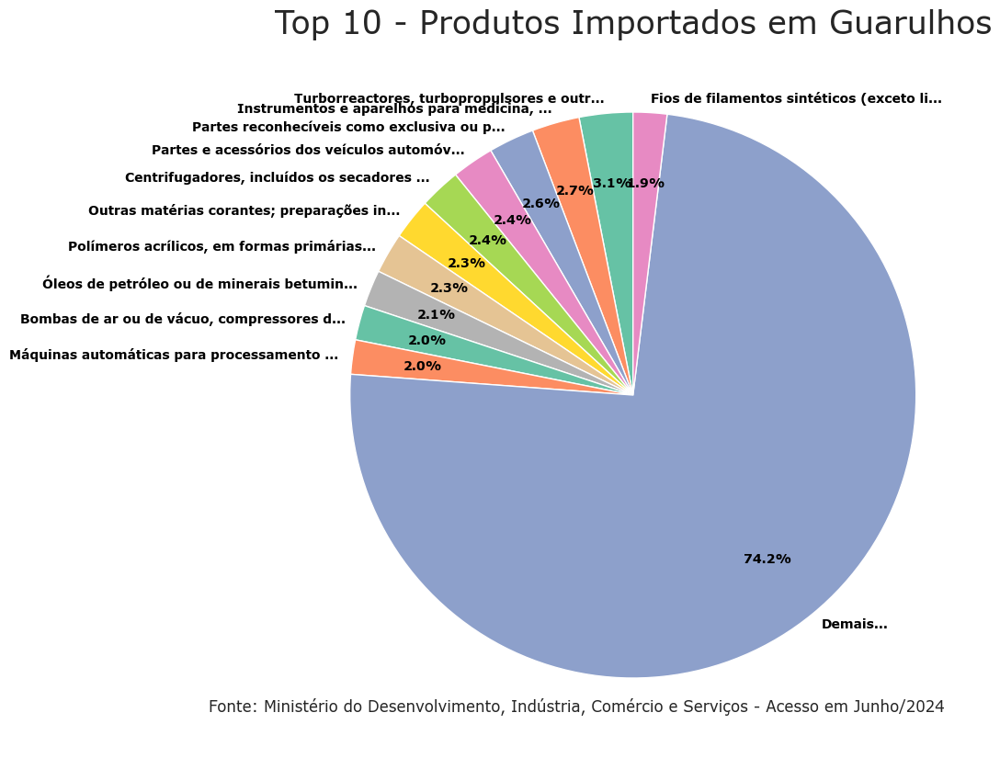

CPU times: total: 891 ms
Wall time: 885 ms


In [17]:
%%time

conn = Connection()
engine = create_engine(conn.current)
try:
    sql = """
        with t as (select pd.cod_produto, pd.nom_produto, sum(i.vl_fob) valor
                     from importacao i 
                    inner join municipio m on (i.cod_muni = m.cod_muni) 
                    inner join produto pd on (i.cod_produto = pd.cod_produto) 
                    inner join pais p on (i.cod_pais = p.cod_pais) 
                    where i.ano = {}
                      and i.sg_uf_mun = 'SP' 
                      and i.cod_muni = 3418800 
                    group by pd.cod_produto, pd.nom_produto
                    order by 3 desc),
             rnk as (select RANK () OVER (ORDER BY t.valor DESC) rank, t.* from t),
             tot as (select case when rank > 11 /*or r.cod_produto = 2710*/ then 11 else rank end rank, 
                            case when rank > 11 /*or r.cod_produto = 2710*/ then 'Demais' else r.nom_produto end dsc_produto, 
                            valor 
                       from rnk r),
             trat as (select rank, substring(dsc_produto, 1, 40) || '...' as dsc_produto, valor from tot)
        select rank, dsc_produto as produto, sum(valor) as valor from trat group by rank, dsc_produto order by 1;
    """.format(ano_ref)
    impprod = pd.read_sql(text(sql), con = engine.connect())
except Exception as e:
    print(str(e))
finally:
    engine.dispose()
    
impprod['valor'] = impprod['valor'].apply(lambda x : x/1000000)

plt.figure(figsize=(20, 10))
sns.set(style="darkgrid")
sns.set_theme(palette="dark", font="Verdana", font_scale=1.2)

explode = [0*i for i in range(0, impprod.shape[0])]

colors = sns.color_palette('Set2')[0:impprod.shape[0]]

labels = impprod["produto"].values.tolist()
data = impprod["valor"].values.tolist()

plt.pie(data, 
        labels = labels,
        colors = colors, 
        explode = explode, 
        #rotatelabels=True,
        startangle=90, 
        autopct = '%.1f%%', 
        pctdistance=0.75, 
        labeldistance=1.05, 
        textprops={'color':'black', 'weight':'bold', 'fontsize':10})

plt.title('Top 10 - Produtos Importados em Guarulhos', size = 25)
plt.text(-1.5, -1.1, "Fonte: Ministério do Desenvolvimento, Indústria, Comércio e Serviços - Acesso em {}/{}".format(acesso, ano_ref), ha='left', va='center', fontsize=12)
plt.show()

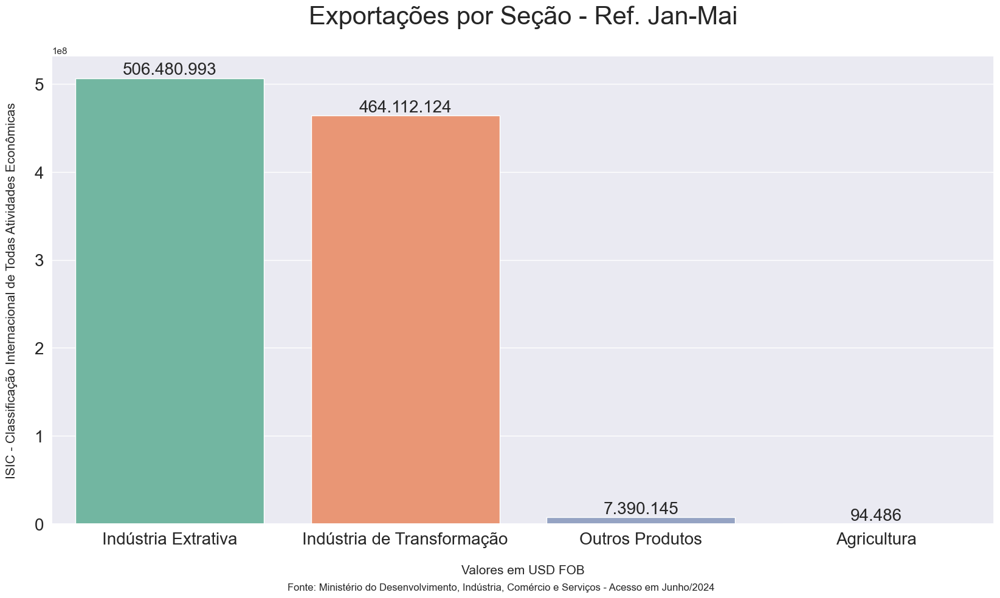

CPU times: total: 625 ms
Wall time: 624 ms


In [18]:
%%time

conn = Connection()
engine = create_engine(conn.current)
try:
    sql = """
        with t0 as (select np.secao, e.mes, e.ano, sum(e.vl_fob) valor, e.mes || '/' || e.ano ref
                      from exportacao e 
                     inner join novoproduto np on (e.cod_produto = np.cod_produto) 
                     where e.cod_muni = 3418800 
                       and e.ano = {}
                     group by np.secao, e.mes, e.ano, e.mes || '/' || e.ano),
             t1 as (select t0.secao, 
                           case t0.secao 
                             when 'A' then 'Agricultura'
                             when 'B' then 'Indústria Extrativa'
                             when 'C' then 'Indústria de Transformação'
                             when 'D' then 'Outros Produtos'
                           else 'N/I' 
                           end dsc_secao,  t0.mes, t0.ano, t0.valor, t0.ref
                      from t0 order by 2, 1)
        select * from t1;
    """.format(ano_ref)
    secprod = pd.read_sql(text(sql), con = engine.connect())
except Exception as e:
    print(str(e))
finally:
    engine.dispose()
    

plt.figure(figsize=(20, 10))
sns.set(style="darkgrid")

ax = sns.barplot(data=secprod.groupby(['dsc_secao'])['valor'].sum().reset_index().sort_values(by='valor', ascending=False), x='dsc_secao', y='valor', palette='Set2')
for bars in ax.containers:
    ax.bar_label(bars, fmt=lambda x: "{:,.0f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation = 0, fontsize=20)

ax.set_ylabel('ISIC - Classificação Internacional de Todas Atividades Econômicas\n', fontsize = 15)
ax.set_xlabel('\nValores em USD FOB', fontsize = 15)
plt.title('Exportações por Seção - Ref. {}\n'.format(ref), size = 30)
plt.text(.5, -10, "\n\n\n\n\n\n\n\n\n\n\n\nFonte: Ministério do Desenvolvimento, Indústria, Comércio e Serviços - Acesso em {}/{}".format(acesso, ano_ref), ha='left', va='center', fontsize=12)
plt.xticks(rotation = 0, fontsize=20)
plt.yticks(rotation = 0, fontsize=20)
plt.show()


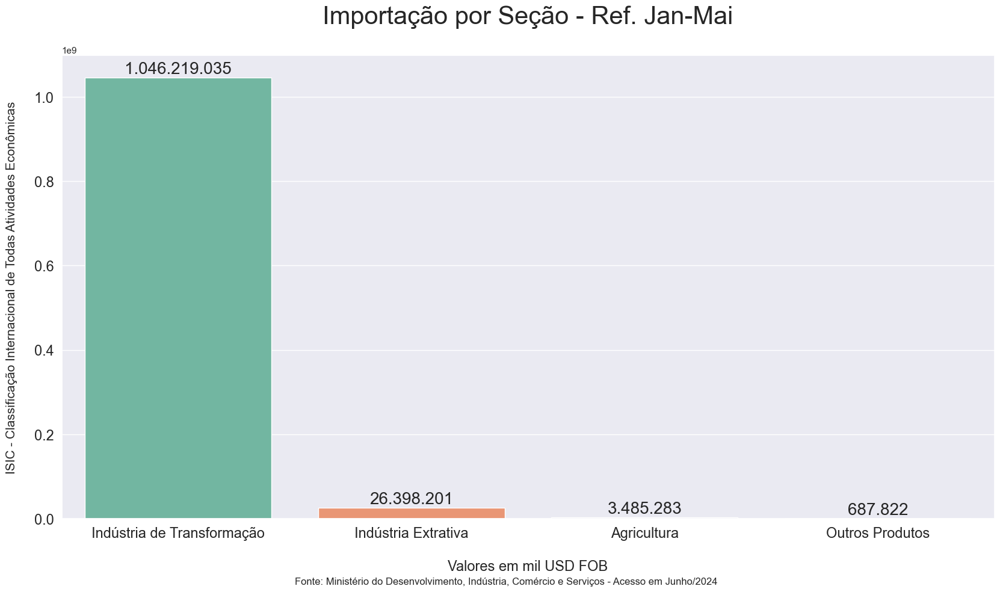

CPU times: total: 859 ms
Wall time: 867 ms


In [19]:
%%time

conn = Connection()
engine = create_engine(conn.current)
try:
    sql = """
        with t0 as (select np.secao, e.mes, e.ano, sum(e.vl_fob) valor, e.mes || '/' || e.ano ref
                      from importacao e 
                     inner join novoproduto np on (e.cod_produto = np.cod_produto) 
                     where e.cod_muni = 3418800 
                       and e.ano = {}
                     group by np.secao, e.mes, e.ano, e.mes || '/' || e.ano),
             t1 as (select t0.secao, 
                           case t0.secao 
                             when 'A' then 'Agricultura'
                             when 'B' then 'Indústria Extrativa'
                             when 'C' then 'Indústria de Transformação'
                             when 'D' then 'Outros Produtos'
                           else 'N/I' 
                           end dsc_secao,  t0.mes, t0.ano, t0.valor, t0.ref
                      from t0 order by 2, 1)
        select * from t1;
    """.format(ano_ref)
    secimpprod = pd.read_sql(text(sql), con = engine.connect())
except Exception as e:
    print(str(e))
finally:
    engine.dispose()
    

plt.figure(figsize=(20, 10))
sns.set(style="darkgrid")

ax = sns.barplot(data=secimpprod.groupby(['dsc_secao'])['valor'].sum().reset_index().sort_values(by='valor', ascending=False), x='dsc_secao', y='valor', palette='Set2')
for bars in ax.containers:
    ax.bar_label(bars, fmt=lambda x: "{:,.0f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation = 0, fontsize=20)

ax.set_ylabel('ISIC - Classificação Internacional de Todas Atividades Econômicas\n', fontsize = 15)
ax.set_xlabel('\nValores em mil USD FOB', fontsize = 17)
plt.title('Importação por Seção - Ref. {}\n'.format(ref), size = 30)
plt.text(.5, 0, "\n\n\n\n\n\n\n\n\n\n\n\nFonte: Ministério do Desenvolvimento, Indústria, Comércio e Serviços - Acesso em {}/{}".format(acesso, ano_ref), ha='left', va='center', fontsize=12)
plt.xticks(rotation = 0, fontsize=17)
plt.yticks(rotation = 0, fontsize=17)
plt.show()

CPU times: total: 781 ms
Wall time: 790 ms


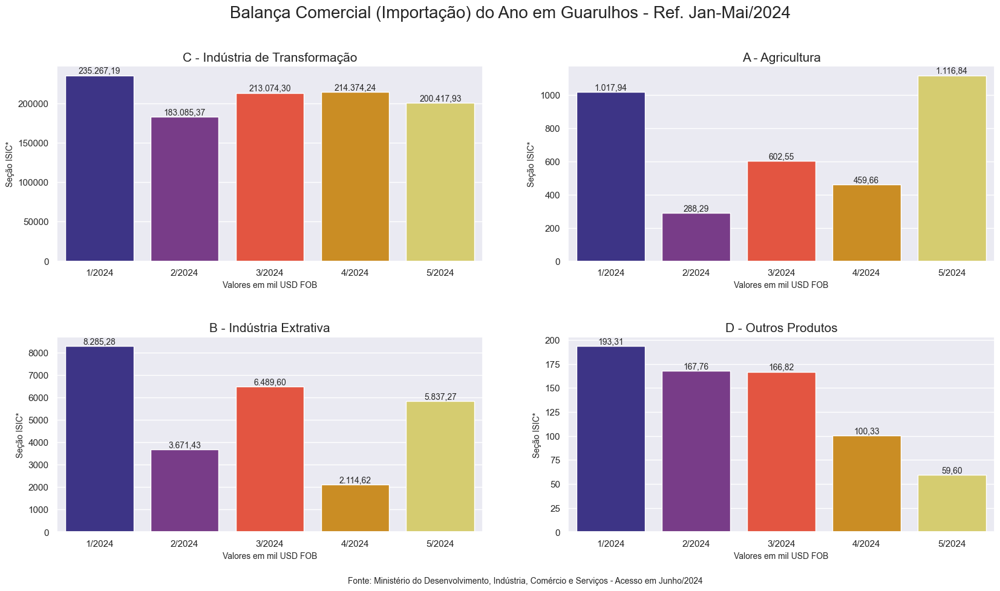

In [20]:
%%time

v_size_col: int = 10

conn = Connection()
engine = create_engine(conn.current)
try:
    sql = """
        with t0 as (select np.secao, e.mes, e.ano, sum(e.vl_fob) valor, e.mes || '/' || e.ano ref
                      from importacao e 
                     inner join novoproduto np on (e.cod_produto = np.cod_produto) 
                     where e.cod_muni = 3418800 
                       and e.ano = {}
                     group by np.secao, e.mes, e.ano, e.mes || '/' || e.ano),
             t1 as (select t0.secao, 
                           case t0.secao 
                             when 'A' then 'Agricultura'
                             when 'B' then 'Indústria Extrativa'
                             when 'C' then 'Indústria de Transformação'
                             when 'D' then 'Outros Produtos'
                           else 'N/I' 
                           end dsc_secao,  t0.mes, t0.ano, t0.valor, t0.ref
                      from t0 order by 2, 1)
        select * from t1;
    """.format(ano_ref)
    secimpprod = pd.read_sql(text(sql), con = engine.connect())
except Exception as e:
    print(str(e))
finally:
    engine.dispose()
    
secimpprod['valor'] = secimpprod['valor'].apply(lambda x : x/1000)

fig, axes = plt.subplots(2, 2, figsize=(20, 10))
sns.set(style="darkgrid")

sns.barplot(ax=axes[0, 0], data=secimpprod.query("dsc_secao == 'Indústria de Transformação'").groupby(['ref', 'dsc_secao'])['valor'].sum().reset_index(), x='ref', y='valor', palette='CMRmap')
axes[0, 0].set_title('C - Indústria de Transformação', size = 15)
for bars in axes[0, 0].containers:
    axes[0, 0].bar_label(bars, fmt=lambda x: "{:,.2f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation = 0, fontsize=v_size_col)
    
sns.barplot(ax=axes[0, 1], data=secimpprod.query("dsc_secao == 'Agricultura'").groupby(['ref', 'dsc_secao'])['valor'].sum().reset_index(), x='ref', y='valor', palette='CMRmap')
axes[0, 1].set_title('A - Agricultura', size = 15)
for bars in axes[0, 1].containers:
    axes[0, 1].bar_label(bars, fmt=lambda x: "{:,.2f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation = 0, fontsize=v_size_col)

fig.subplots_adjust(hspace=0.39, wspace=0.2)

sns.barplot(ax=axes[1, 0], data=secimpprod.query("dsc_secao == 'Indústria Extrativa'").groupby(['ref', 'dsc_secao'])['valor'].sum().reset_index(), x='ref', y='valor', palette='CMRmap')
axes[1, 0].set_title('B - Indústria Extrativa', size = 15)
for bars in axes[1, 0].containers:
    axes[1, 0].bar_label(bars, fmt=lambda x: "{:,.2f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation = 0, fontsize=v_size_col)
    
sns.barplot(ax=axes[1, 1], data=secimpprod.query("dsc_secao == 'Outros Produtos'").groupby(['ref', 'dsc_secao'])['valor'].sum().reset_index(), x='ref', y='valor', palette='CMRmap')
axes[1, 1].set_title('D - Outros Produtos', size = 15)
for bars in axes[1, 1].containers:
    axes[1, 1].bar_label(bars, fmt=lambda x: "{:,.2f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation = 0, fontsize=v_size_col)

axes[0,0].set_ylabel('Seção ISIC*', fontsize = 10)
axes[0,0].set_xlabel('Valores em mil USD FOB', fontsize = 10)
axes[0,1].set_ylabel('Seção ISIC*', fontsize = 10)
axes[0,1].set_xlabel('Valores em mil USD FOB', fontsize = 10)
axes[1,0].set_ylabel('Seção ISIC*', fontsize = 10)
axes[1,0].set_xlabel('Valores em mil USD FOB', fontsize = 10)
axes[1,1].set_ylabel('Seção ISIC*', fontsize = 10)
axes[1,1].set_xlabel('Valores em mil USD FOB', fontsize = 10)

fig.suptitle('Balança Comercial (Importação) do Ano em Guarulhos - Ref. {}/{}\n'.format(ref, ano_ref), size = 20)

#ft1 = "\n\n\n\n\nFonte: Ministério do Desenvolvimento, Indústria, Comércio e Serviços - Acesso em Junho/2023"
#ft2 = "\n\n\n\n\n\n\n*ISIC - Classificação Internacional de Todas Atividades Econômicas"

#plt.text(1, .5, ft1, ha='center', va='top', fontsize=10)
#plt.text(1, .5, ft2, ha='center', va='top', fontsize=10)
#plt.xticks(rotation = 0, fontsize=20)
#plt.yticks(rotation = 0, fontsize=20)
plt.text(-1, -10, "\n\n\n\n\n\n\n\nFonte: Ministério do Desenvolvimento, Indústria, Comércio e Serviços - Acesso em {}/{}".format(acesso, ano_ref), ha='center', va='center', fontsize=10)

fig.show()

CPU times: total: 516 ms
Wall time: 520 ms


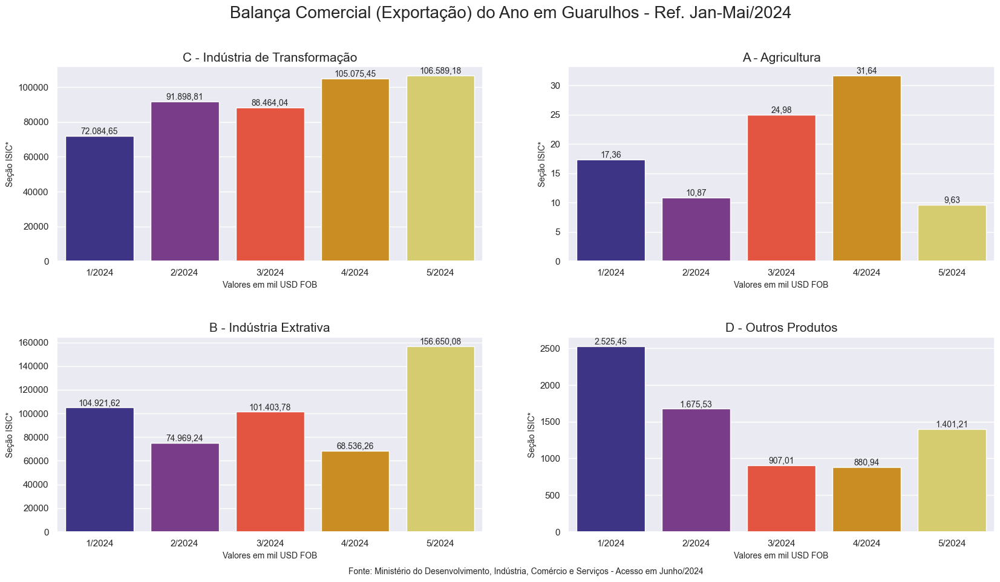

In [21]:
%%time

v_size_col: int = 10

conn = Connection()
engine = create_engine(conn.current)
try:
    sql = """
        with t0 as (select np.secao, e.mes, e.ano, sum(e.vl_fob) valor, e.mes || '/' || e.ano ref
                      from exportacao e 
                     inner join novoproduto np on (e.cod_produto = np.cod_produto) 
                     where e.cod_muni = 3418800 
                       and e.ano = {}
                     group by np.secao, e.mes, e.ano, e.mes || '/' || e.ano),
             t1 as (select t0.secao, 
                           case t0.secao 
                             when 'A' then 'Agricultura'
                             when 'B' then 'Indústria Extrativa'
                             when 'C' then 'Indústria de Transformação'
                             when 'D' then 'Outros Produtos'
                           else 'N/I' 
                           end dsc_secao,  t0.mes, t0.ano, t0.valor, t0.ref
                      from t0 order by 2, 1)
        select * from t1;
    """.format(ano_ref)
    secprod = pd.read_sql(text(sql), con = engine.connect())
except Exception as e:
    print(str(e))
finally:
    engine.dispose()

#plt.figure(figsize=(20, 10))
    
secprod['valor'] = secprod['valor'].apply(lambda x : x/1000)

fig, axes = plt.subplots(2, 2, figsize=(20, 10))
sns.set(style="darkgrid")

sns.barplot(ax=axes[0, 0], data=secprod.query("dsc_secao == 'Indústria de Transformação'").groupby(['ref', 'dsc_secao'])['valor'].sum().reset_index(), x='ref', y='valor', palette='CMRmap')
axes[0, 0].set_title('C - Indústria de Transformação', size = 15)
for bars in axes[0, 0].containers:
    axes[0, 0].bar_label(bars, fmt=lambda x: "{:,.2f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation = 0, fontsize=v_size_col)
    
sns.barplot(ax=axes[0, 1], data=secprod.query("dsc_secao == 'Agricultura'").groupby(['ref', 'dsc_secao'])['valor'].sum().reset_index(), x='ref', y='valor', palette='CMRmap')
axes[0, 1].set_title('A - Agricultura', size = 15)
for bars in axes[0, 1].containers:
    axes[0, 1].bar_label(bars, fmt=lambda x: "{:,.2f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation = 0, fontsize=v_size_col)

fig.subplots_adjust(hspace=0.39, wspace=0.2)

sns.barplot(ax=axes[1, 0], data=secprod.query("dsc_secao == 'Indústria Extrativa'").groupby(['ref', 'dsc_secao'])['valor'].sum().reset_index(), x='ref', y='valor', palette='CMRmap')
axes[1, 0].set_title('B - Indústria Extrativa', size = 15)
for bars in axes[1, 0].containers:
    axes[1, 0].bar_label(bars, fmt=lambda x: "{:,.2f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation = 0, fontsize=v_size_col)
    
sns.barplot(ax=axes[1, 1], data=secprod.query("dsc_secao == 'Outros Produtos'").groupby(['ref', 'dsc_secao'])['valor'].sum().reset_index(), x='ref', y='valor', palette='CMRmap')
axes[1, 1].set_title('D - Outros Produtos', size = 15)
for bars in axes[1, 1].containers:
    axes[1, 1].bar_label(bars, fmt=lambda x: "{:,.2f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation = 0, fontsize=v_size_col)

axes[0,0].set_ylabel('Seção ISIC*', fontsize = 10)
axes[0,0].set_xlabel('Valores em mil USD FOB', fontsize = 10)
axes[0,1].set_ylabel('Seção ISIC*', fontsize = 10)
axes[0,1].set_xlabel('Valores em mil USD FOB', fontsize = 10)
axes[1,0].set_ylabel('Seção ISIC*', fontsize = 10)
axes[1,0].set_xlabel('Valores em mil USD FOB', fontsize = 10)
axes[1,1].set_ylabel('Seção ISIC*', fontsize = 10)
axes[1,1].set_xlabel('Valores em mil USD FOB', fontsize = 10)

fig.suptitle('Balança Comercial (Exportação) do Ano em Guarulhos - Ref. {}/{}\n'.format(ref, ano_ref), size = 20)

#ft1 = "\n\n\n\n\nFonte: Ministério do Desenvolvimento, Indústria, Comércio e Serviços - Acesso em Junho/2023"
#ft2 = "\n\n\n\n\n\n\n*ISIC - Classificação Internacional de Todas Atividades Econômicas"

#plt.text(1, .5, ft1, ha='center', va='top', fontsize=10)
#plt.text(1, .5, ft2, ha='center', va='top', fontsize=10)
#plt.xticks(rotation = 0, fontsize=20)
#plt.yticks(rotation = 0, fontsize=20)
plt.text(-1, -10, "\n\n\n\n\n\n\n\nFonte: Ministério do Desenvolvimento, Indústria, Comércio e Serviços - Acesso em {}/{}".format(acesso, ano_ref), ha='center', va='center', fontsize=10)
fig.show()

CPU times: total: 172 ms
Wall time: 178 ms


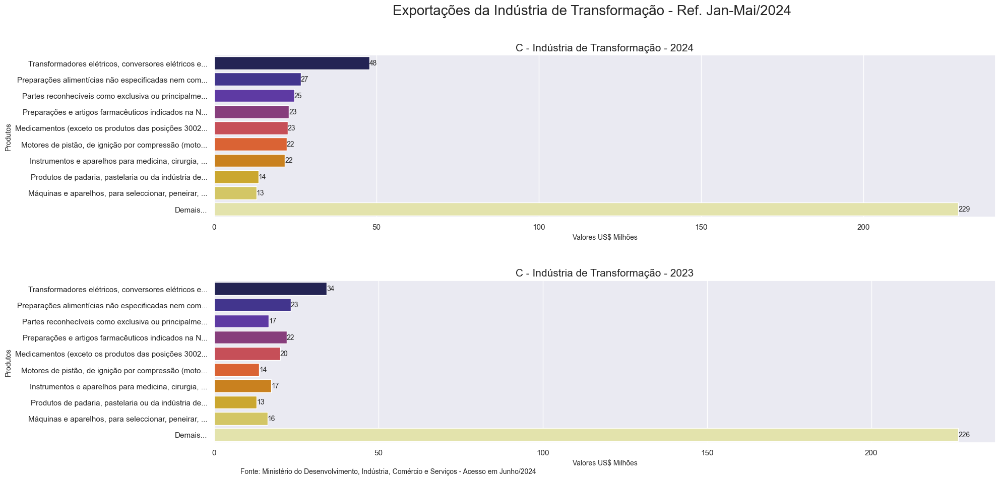

In [22]:
%%time

conn = Connection()
engine = create_engine(conn.current)
try:
    sql = ["""
        with t as (select substr(pd.nom_produto, 1, 50) || '...' produto, e.ano, sum(e.vl_fob) valor
                     from exportacao e 
                    inner join novoproduto pd on (e.cod_produto = pd.cod_produto) 
                    where e.cod_muni = 3418800 
                     and e.ano = {}
                     and pd.secao = 'C'
                     and e.mes <= (select max(mes) from exportacao where ano = {})
                    group by substr(pd.nom_produto, 1, 50) || '...', e.ano order by 2),
             tot as (select RANK () OVER (ORDER BY t.valor DESC) rank, t.* from t),
             trat as (select case when rank > 10 then 11 else rank end rank, case when rank > 10 then 'Demais...' else produto end produto, ano, valor from tot)
        select rank, produto, ano, sum(valor) as val from trat group by rank, produto, ano order by 1;
    """.format(ano_ant, ano_ref), """
        with t as (select substr(pd.nom_produto, 1, 50) || '...' produto, e.ano, sum(e.vl_fob) valor
                     from exportacao e 
                    inner join novoproduto pd on (e.cod_produto = pd.cod_produto) 
                    where e.cod_muni = 3418800 
                     and e.ano = {}
                     and pd.secao = 'C'
                     and e.mes <= (select max(mes) from exportacao where ano = {})
                    group by substr(pd.nom_produto, 1, 50) || '...', e.ano order by 2),
             tot as (select RANK () OVER (ORDER BY t.valor DESC) rank, t.* from t),
             trat as (select case when rank > 10 then 11 else rank end rank, case when rank > 10 then 'Demais...' else produto end produto, ano, valor from tot)
        select rank, produto, ano, sum(valor) as val from trat group by rank, produto, ano order by 1;
    """.format(ano_ref, ano_ref)]
    c1 = pd.read_sql(text(sql[0]), con = engine.connect())
    c2 = pd.read_sql(text(sql[1]), con = engine.connect())
except Exception as e:
    print(str(e))
finally:
    engine.dispose()
    
c1['val'] = c1['val'].apply(lambda x : x/1000000)
c2['val'] = c2['val'].apply(lambda x : x/1000000)
    
transform = c2.merge(c1, how='inner', on=['produto'])

fig, axes = plt.subplots(2, 1, figsize=(20, 10))
sns.set(style="darkgrid")

sns.barplot(ax=axes[0], data=transform.query("ano_x == {}".format(ano_ref)), y='produto', x='val_x', palette='CMRmap')
axes[0].set_title('C - Indústria de Transformação - {}'.format(ano_ref), size = 15)
for bars in axes[0].containers:
    axes[0].bar_label(bars, fmt=lambda x: "{:,.0f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation = 0, fontsize=10)
    
sns.barplot(ax=axes[1], data=transform.query("ano_y == {}".format(ano_ant)), y='produto', x='val_y', palette='CMRmap')
axes[1].set_title('C - Indústria de Transformação - {}'.format(ano_ant), size = 15)
for bars in axes[1].containers:
    axes[1].bar_label(bars, fmt=lambda x: "{:,.0f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation = 0, fontsize=10)

fig.subplots_adjust(hspace=0.39, wspace=0.2)

axes[0].set_ylabel('Produtos', fontsize = 10)
axes[0].set_xlabel('Valores US$ Milhões', fontsize = 10)
axes[1].set_ylabel('Produtos', fontsize = 10)
axes[1].set_xlabel('Valores US$ Milhões', fontsize = 10)

axes[0].tick_params(axis='x', rotation=0)
axes[1].tick_params(axis='x', rotation=0)

fig.suptitle('Exportações da Indústria de Transformação - Ref. {}/{}'.format(ref, ano_ref), size = 20)

#ft1 = "\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\nFonte: Ministério do Desenvolvimento, Indústria, Comércio e Serviços - Acesso em Junho/2023"
#plt.text(.5, .5, ft1, ha='center', va='top', fontsize=10)
plt.text(8, 8, "\n\n\n\n\n\n\n\n\n\n\n\n\nFonte: Ministério do Desenvolvimento, Indústria, Comércio e Serviços - Acesso em {}/{}".format(acesso, ano_ref), ha='left', va='center', fontsize=10)
fig.show()

ValueError: min() iterable argument is empty

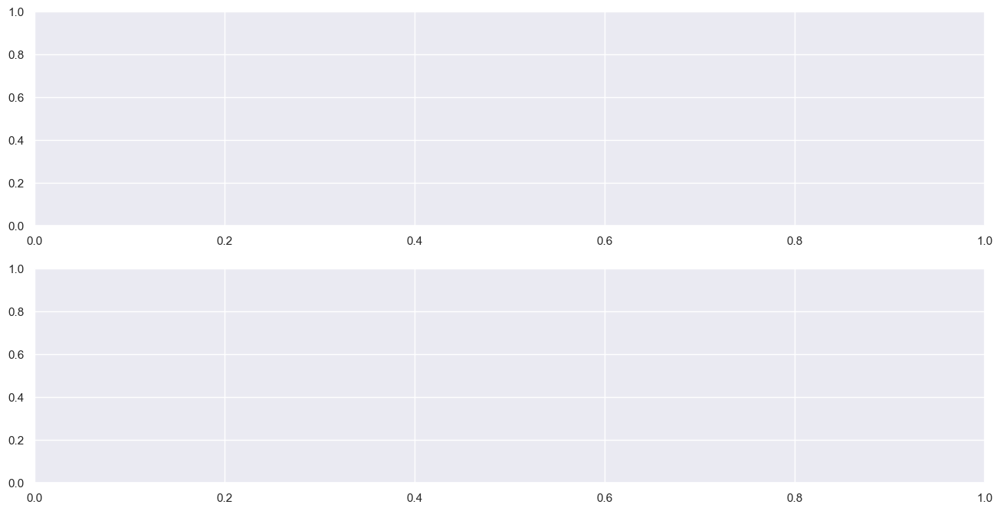

In [23]:
%%time

conn = Connection()
engine = create_engine(conn.current)
try:
    sql = ["""
        with t as (select substr(pd.nom_produto, 1, 50) || '...' produto, i.ano, sum(i.vl_fob) valor
                     from importacao i 
                    inner join novoproduto pd on (i.cod_produto = pd.cod_produto) 
                    where i.cod_muni = 3418800 
                     and i.ano = {}
                     and pd.secao = 'C'
                     and i.mes <= (select max(mes) from exportacao where ano = {})
                    group by substr(pd.nom_produto, 1, 50) || '...', i.ano order by 2),
             tot as (select RANK () OVER (ORDER BY t.valor DESC) rank, t.* from t),
             trat as (select case when rank > 10 then 11 else rank end rank, case when rank > 10 then 'Demais...' else produto end produto, ano, valor from tot)
        select rank, produto, ano, sum(valor) as val from trat group by rank, produto, ano order by 1;
    """.format(ano_ant, ano_ref), """
        with t as (select substr(pd.nom_produto, 1, 50) || '...' produto, i.ano, sum(i.vl_fob) valor
                     from importacao i
                    inner join novoproduto pd on (i.cod_produto = pd.cod_produto) 
                    where i.cod_muni = 3418800 
                     and i.ano = {}
                     and pd.secao = 'C'
                     and i.mes <= (select max(mes) from exportacao where ano = {})
                    group by substr(pd.nom_produto, 1, 50) || '...', i.ano order by 2),
             tot as (select RANK () OVER (ORDER BY t.valor DESC) rank, t.* from t),
             trat as (select case when rank > 10 then 11 else rank end rank, case when rank > 10 then 'Demais...' else produto end produto, ano, valor from tot)
        select rank, produto, ano, sum(valor) as val from trat group by rank, produto, ano order by 1;
    """.format(ano_ref, ano_ref)]
    c1 = pd.read_sql(text(sql[0]), con = engine.connect())
    c2 = pd.read_sql(text(sql[1]), con = engine.connect())
except Exception as e:
    print(str(e))
finally:
    engine.dispose()
    
c1['val'] = c1['val'].apply(lambda x : x/1000000)
c2['val'] = c2['val'].apply(lambda x : x/1000000)
    
tranform = c2.merge(c1, how='inner', on=['produto'])

fig, axes = plt.subplots(2, 1, figsize=(16, 8))
sns.set(style="darkgrid")

sns.barplot(ax=axes[0], data=tranform.query("ano_x == 2023"), y='produto', x='val_x', palette='CMRmap')
axes[0].set_title('C - Indústria de Transformação - 2023', size = 15)
for bars in axes[0].containers:
    axes[0].bar_label(bars, fmt=lambda x: "{:,.0f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation = 0, fontsize=10)
    
sns.barplot(ax=axes[1], data=tranform.query("ano_y == 2022"), y='produto', x='val_y', palette='CMRmap')
axes[1].set_title('C - Indústria de Transformação - 2022', size = 15)
for bars in axes[1].containers:
    axes[1].bar_label(bars, fmt=lambda x: "{:,.0f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation = 0, fontsize=10)

fig.subplots_adjust(hspace=0.39, wspace=0.2)

axes[0].set_ylabel('Produtos', fontsize = 10)
axes[0].set_xlabel('Valores US$ Milhões', fontsize = 10)
axes[1].set_ylabel('Produtos', fontsize = 10)
axes[1].set_xlabel('Valores US$ Milhões', fontsize = 10)

axes[0].tick_params(axis='x', rotation=0)
axes[1].tick_params(axis='x', rotation=0)

fig.suptitle('Importações da Indústria de Transformação - Ref. {}/{}'.format(ref, ano_ref), size = 20)

#ft1 = "\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\nFonte: Ministério do Desenvolvimento, Indústria, Comércio e Serviços - Acesso em Junho/2023"
#plt.text(.5, .5, ft1, ha='center', va='top', fontsize=10)
plt.text(1, 8, "\n\n\n\n\n\n\n\n\n\n\n\n\nFonte: Ministério do Desenvolvimento, Indústria, Comércio e Serviços - Acesso em {}/{}".format(acesso, ano_ref), ha='left', va='center', fontsize=10)
fig.show()

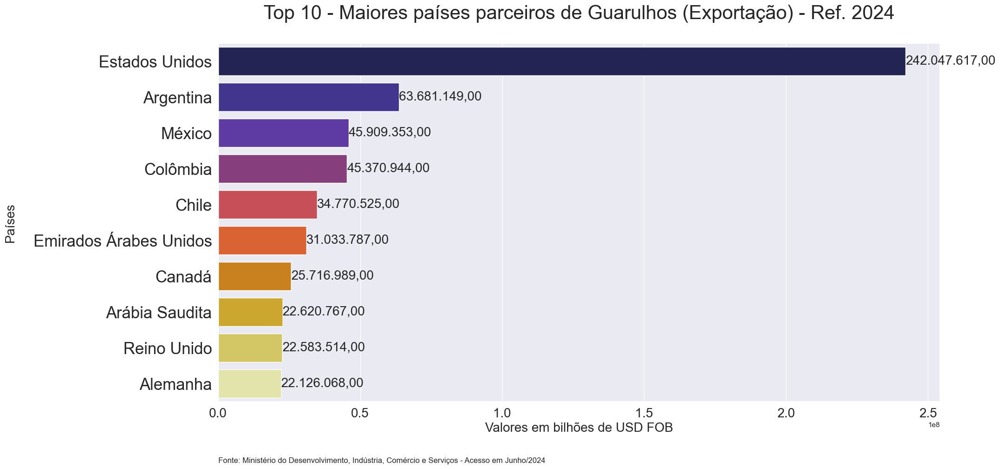

CPU times: total: 656 ms
Wall time: 662 ms


In [24]:
%%time

conn = Connection()
engine = create_engine(conn.current)
try:
    sql = """
        select p.nom_pais as pais, sum(e.vl_fob) valor
          from exportacao e 
         inner join municipio m on (e.cod_muni = m.cod_muni) 
         inner join produto pd on (e.cod_produto = pd.cod_produto) 
         inner join pais p on (e.cod_pais = p.cod_pais) 
         where e.ano = {} 
           and e.sg_uf_mun = 'SP' 
           and e.cod_muni = 3418800 
           and p.nom_pais != 'Brasil'
         group by p.nom_pais
         order by 2 desc limit 10;
    """.format(ano_ref)
    df4 = pd.read_sql(text(sql), con = engine.connect())
except Exception as e:
    print(str(e))
finally:
    engine.dispose()
    
# df4['valor'] = df4['valor'].apply(lambda x : x/100000000)

plt.figure(figsize=(20, 10))
sns.set(style="darkgrid")

ax = sns.barplot(data=df4, y='pais', x='valor', palette='CMRmap')
for bars in ax.containers:
    ax.bar_label(bars, fmt=lambda x: "{:,.2f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation = 0, fontsize=20)

ax.set_ylabel('Países\n', fontsize = 20)
ax.set_xlabel('Valores em bilhões de USD FOB', fontsize = 20)
plt.title('Top 10 - Maiores países parceiros de Guarulhos (Exportação) - Ref. {}\n'.format(ano_ref), size = 30)
plt.text(1, 9.8, "\n\n\n\n\n\n\n\n\n\n\n\nFonte: Ministério do Desenvolvimento, Indústria, Comércio e Serviços - Acesso em {}/{}".format(acesso, ano_ref), ha='left', va='center', fontsize=12)
plt.xticks(rotation = 0, fontsize=20)
plt.yticks(rotation = 0, fontsize=25)
plt.show()

<Figure size 2500x1500 with 0 Axes>

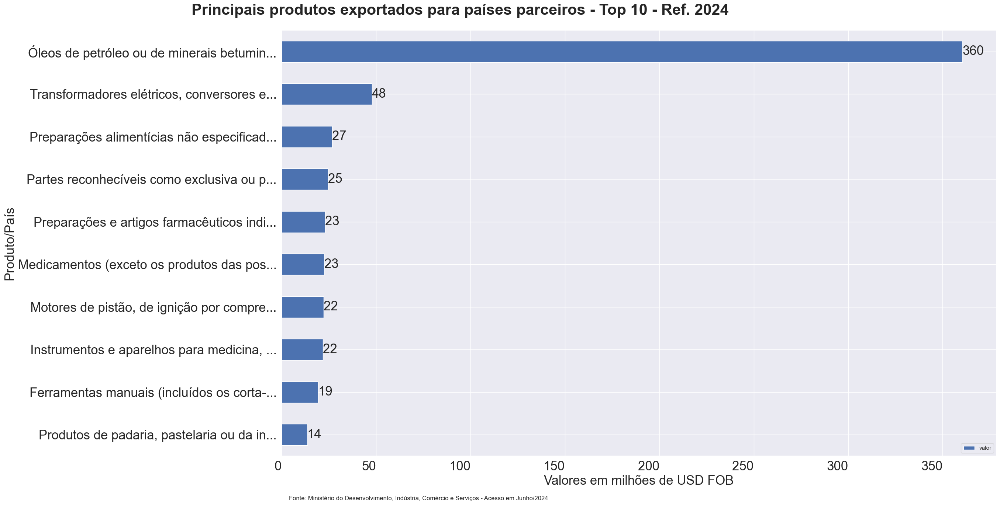

CPU times: total: 703 ms
Wall time: 704 ms


In [25]:
%%time

conn = Connection()
engine = create_engine(conn.current)
try:
    sql = """
        select substring(pd.nom_produto, 1, 40) || '...' as produto, sum(e.vl_fob) valor
          from exportacao e 
         inner join municipio m on (e.cod_muni = m.cod_muni) 
         inner join produto pd on (e.cod_produto = pd.cod_produto) 
         inner join pais p on (e.cod_pais = p.cod_pais) 
         where e.ano = {}
           and e.sg_uf_mun = 'SP' 
           and p.nom_pais != 'Brasil'
           and e.cod_muni = 3418800 
         group by substring(pd.nom_produto, 1, 40) || '...'
         order by 2 desc;
    """.format(ano_ref)
    df = pd.read_sql(text(sql), con = engine.connect())
except Exception as e:
    print(str(e))
finally:
    engine.dispose()
    
df['valor'] = df['valor'].apply(lambda x : x/1000000)

plt.figure(figsize=(25, 15))
sns.set(style="darkgrid")
ax = df.groupby(['produto'])[['valor']].sum().sort_values(by='valor', ascending=False)[0:10].plot.barh(figsize=(25, 15))

for bars in ax.containers:
    ax.bar_label(bars, fmt=lambda x: "{:,.0f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation=0, fontsize=25)

ax.set_xlabel('Valores em milhões de USD FOB', fontsize = 25)
ax.set_ylabel('Produto/País', fontsize = 25)
ax.set_title('Principais produtos exportados para países parceiros - Top 10 - Ref. {}'.format(ano_ref), fontdict={'fontsize': 30, 'fontweight': 'bold'}, y=1.0, x=.25, pad=30)
plt.text(4, 10.5, "Fonte: Ministério do Desenvolvimento, Indústria, Comércio e Serviços - Acesso em {}/{}".format(acesso, ano_ref), ha='left', va='center', fontsize=12)
# ax.invert_xaxis()
ax.invert_yaxis()

plt.setp(ax.get_xticklabels(), rotation=0, ha="right", rotation_mode="anchor", fontsize=25)
plt.setp(ax.get_yticklabels(), rotation=0, ha="right", rotation_mode="anchor", fontsize=25)
plt.show()

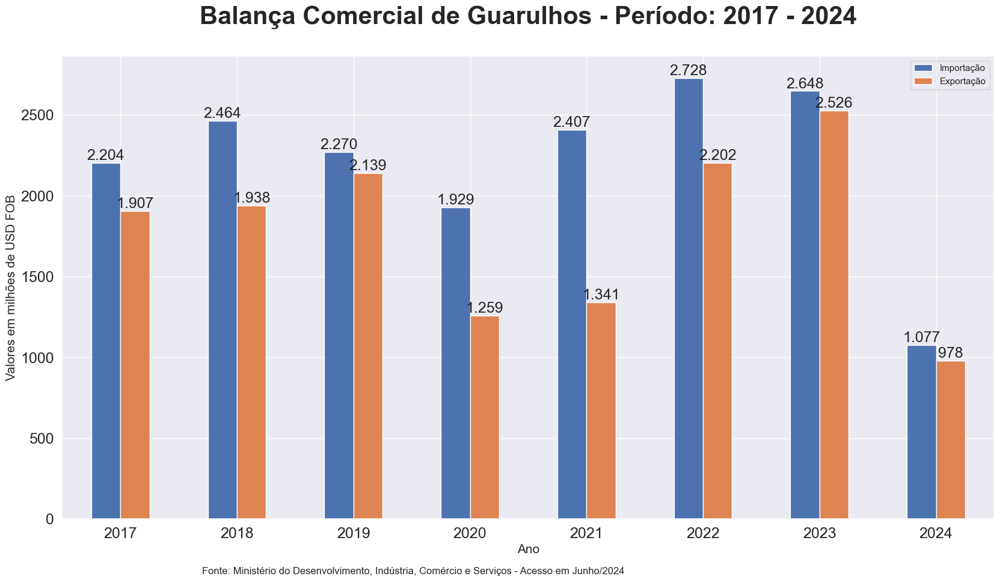

CPU times: total: 1.52 s
Wall time: 1.62 s


In [28]:
%%time

conn = Connection()
engine = create_engine(conn.current)
try:
    sql = """
        with imp as (select i.ano, sum(i.vl_fob) valor
                       from importacao i
                      inner join municipio m on (i.cod_muni = m.cod_muni) 
                      where i.sg_uf_mun = 'SP' 
                        and i.cod_muni = 3418800 
                      group by i.ano), 
             exp as (select e.ano, sum(e.vl_fob) valor
                       from exportacao e
                      inner join municipio m on (e.cod_muni = m.cod_muni) 
                      where e.sg_uf_mun = 'SP' 
                        and e.cod_muni = 3418800 
                      group by e.ano)
        select e.ano, coalesce(i.valor, 0) as "Importação", coalesce(e.valor, 0) as "Exportação" 
          from imp i right outer join exp e on (i.ano = e.ano) order by 1;
    """
    df = pd.read_sql(text(sql), con = engine.connect())
except Exception as e:
    print(str(e))
finally:
    engine.dispose()
    
df['Importação'] = df['Importação'].apply(lambda x : x/1000000)
df['Exportação'] = df['Exportação'].apply(lambda x : x/1000000)  

sns.set(style="darkgrid")
ax = df.query('ano > 2016').set_index('ano').plot.bar(figsize=(20, 10))
for bars in ax.containers:
    ax.bar_label(bars, fmt=lambda x: "{:,.0f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation=0, fontsize=18)

ax.set_ylabel('Valores em milhões de USD FOB', fontsize = 15)
ax.set_xlabel('Ano', fontsize = 15)
ax.set_title('Balança Comercial de Guarulhos - Período: 2017 - 2024\n', fontdict={'fontsize': 30, 'fontweight': 'bold'}) #, y=1.0, x=.25, pad=30)
plt.text(.7, -1, "\n\n\n\n\n\n\n\n\n\nFonte: Ministério do Desenvolvimento, Indústria, Comércio e Serviços - Acesso em {}/{}".format(acesso, ano_ref), ha='left', va='center', fontsize=12)
# ax.invert_xaxis()
#ax.invert_yaxis()

plt.setp(ax.get_xticklabels(), rotation=0, ha="center", rotation_mode="anchor", fontsize=18)
plt.setp(ax.get_yticklabels(), rotation=0, ha="right", rotation_mode="anchor", fontsize=18)
plt.show()

In [27]:
sns.set(style="darkgrid")
ax = df.set_index('nom_pais')[0:5].plot.bar(figsize=(20, 10))
plt.figure(figsize=(20, 10))
for bars in ax.containers:
    ax.bar_label(bars, fmt=lambda x: "{:,.0f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation=0, fontsize=15)

ax.set_xlabel('Valores em milhões de USD FOB', fontsize = 20)
ax.set_ylabel('País', fontsize = 20)
ax.set_title('Balança Comercial - Países - Ref. 2022\n', fontdict={'fontsize': 30, 'fontweight': 'bold'}) #, y=1.0, x=.25, pad=30)
# plt.text(.3, 1.1, "Fonte: Ministério do Desenvolvimento, Indústria, Comércio e Serviços - Acesso em Junho/2023", ha='left', va='center', fontsize=12)
# ax.invert_xaxis()
#ax.invert_yaxis()

plt.setp(ax.get_xticklabels(), rotation=0, ha="right", rotation_mode="anchor", fontsize=15)
plt.setp(ax.get_yticklabels(), rotation=0, ha="right", rotation_mode="anchor", fontsize=15)
plt.show()

KeyError: "None of ['nom_pais'] are in the columns"

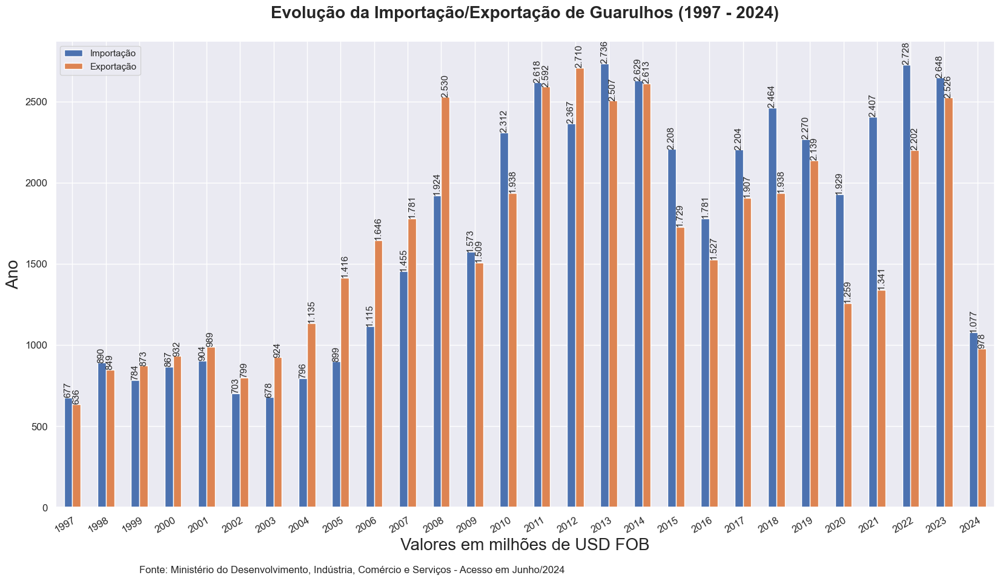

CPU times: total: 1.75 s
Wall time: 1.78 s


In [30]:
%%time

conn = Connection()
engine = create_engine(conn.current)
try:
    sql = """
       with imp as (select i.ano, sum(i.vl_fob) valor
                   from importacao i
                  where i.sg_uf_mun = 'SP' 
                    and i.cod_muni = 3418800
                  group by i.ano), 
         exp as (select e.ano, sum(e.vl_fob) valor
                   from exportacao e
                  where e.sg_uf_mun = 'SP' 
                    and e.cod_muni = 3418800
                  group by e.ano)
    select i.ano, coalesce(i.valor, 0) as "Importação", coalesce(e.valor, 0) as "Exportação" 
      from imp i inner join exp e on (i.ano = e.ano);
    """
    df7 = pd.read_sql(text(sql), con = engine.connect())
except Exception as e:
    print(str(e))
finally:
    engine.dispose()
    
df7['Importação'] = df7['Importação'].apply(lambda x : x/1000000)
df7['Exportação'] = df7['Exportação'].apply(lambda x : x/1000000)

sns.set(style="darkgrid")
ax = df7.set_index('ano').plot.bar(figsize=(20, 10))
for bars in ax.containers:
    ax.bar_label(bars, fmt=lambda x: "{:,.0f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation=90, fontsize=11)

ax.set_xlabel('Valores em milhões de USD FOB', fontsize = 20)
ax.set_ylabel('Ano', fontsize = 20)
ax.set_title('Evolução da Importação/Exportação de Guarulhos (1997 - {})\n'.format(ano_ref), fontdict={'fontsize': 20, 'fontweight': 'bold'}) #, y=1.0, x=.25, pad=30)

# ax.invert_xaxis()
#ax.invert_yaxis()
plt.text(2, .1, "\n\n\n\n\n\n\n\n\n\n\n\nFonte: Ministério do Desenvolvimento, Indústria, Comércio e Serviços - Acesso em {}/{}".format(acesso, ano_ref), ha='left', va='center', fontsize=12)
plt.setp(ax.get_xticklabels(), rotation=30, ha="right", rotation_mode="anchor", fontsize=12)
plt.setp(ax.get_yticklabels(), rotation=0, ha="right", rotation_mode="anchor", fontsize=12)
plt.show()

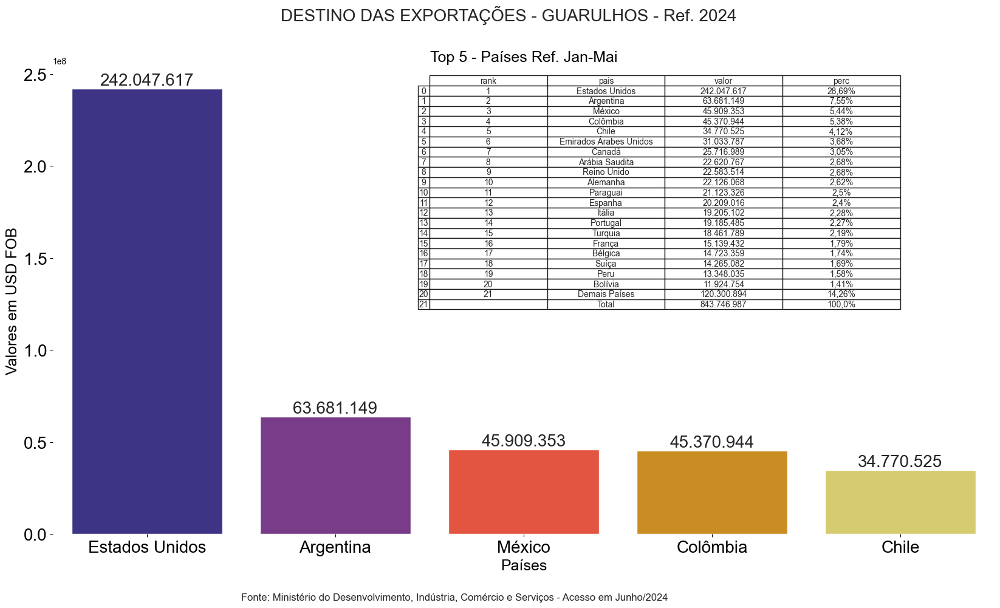

CPU times: total: 2.36 s
Wall time: 2.4 s


In [6]:
%%time

sql_exp = list()

try:
    for i in range(2024, 2025):
            sql_exp.append("""
               with t as (select RANK () OVER (ORDER BY sum(e.vl_fob) DESC) rank, p.nom_pais as pais, e.ano, sum(e.vl_fob) valor
                            from exportacao e 
                           inner join produto pd on (e.cod_produto = pd.cod_produto) 
                           inner join pais p on (e.cod_pais = p.cod_pais) 
                           where e.ano = {}
                             and e.sg_uf_mun = 'SP' 
                             and e.cod_muni = 3418800 
                               --and p.nom_pais not in('Brasil', 'Provisão de Navios e Aeronaves')
                             and p.cod_pais != 105
                           group by p.nom_pais, e.ano
                           order by 3 desc),
                    tt as (select case when rank > 20 then 21 else rank end rank, case when rank > 20 then 'Demais Países' else pais end pais, ano, valor from t),
                    ff as (select rank, pais, ano, sum(valor) as valor from tt group by rank, pais, ano order by 1),
                    tot as (select cast(sum(valor) as float) as total from ff),     
                    f as (select f.*, round((cast(f.valor as float)/(select * from tot)) * 100., 2) as perc from ff f)
               select * from f;
            """.format(i))
            
except Exception as e:
    print(str(e))
    
conn = Connection()
engine = create_engine(conn.current)
paises_exp = list()
try:
    for i in range(0, len(sql_exp)):
        paises_exp.append(pd.read_sql(text(sql_exp[i]), con = engine.connect()))
    
except Exception as e:
    print(str(e))
finally:
    engine.dispose()

t = 0
# del paisestable_exp
paisestable_exp = paises_exp[t].copy()
paisestable_exp.loc['Total'] = pd.Series(['', '', paises_exp[t]['valor'].sum(), round(paises_exp[t]['perc'].sum(),1)], index = ['rank', 'pais', 'valor', 'perc'])
paisestable_exp['valor'] = paisestable_exp.valor.apply(lambda x: fmt(x))
paisestable_exp['perc'] = paisestable_exp['perc'].astype(str)
paisestable_exp['perc'] = paisestable_exp.perc.apply(lambda x: x.replace('.', ',')+'%')
paisestable_exp.drop(['ano'], axis=1, inplace=True)

for i in range(0, len(paises_exp)):
    paisestable_exp = paises_exp[i].copy()
    paisestable_exp.loc['21'] = pd.Series(['', 'Total', paises_exp[i]['valor'].sum(), round(paises_exp[i]['perc'].sum(),1)], index = ['rank', 'pais', 'valor', 'perc'])
    paisestable_exp['valor'] = paisestable_exp.valor.apply(lambda x: fmti(x))
    paisestable_exp['perc'] = paisestable_exp['perc'].astype(str)
    paisestable_exp['perc'] = paisestable_exp.perc.apply(lambda x: x.replace('.', ',')+'%')
    paisestable_exp.drop(['ano'], axis=1, inplace=True)

    fig, ax = plt.subplots(figsize=(20, 10))
    sns.set_style("whitegrid", {'axes.grid' : False, 'axes.facecolor':'white'})
    sns.despine(bottom = True, left = True)
    ax.grid(False)
    sns.set(style="darkgrid")

    table = plt.table(cellText=paisestable_exp.values, 
                      colWidths=[0.3]*len(paisestable_exp.keys()), 
                      colLabels=paisestable_exp.keys(), 
                      rowLabels=paisestable_exp.index, 
                      cellLoc='center', 
                      rowLoc='center', 
                      bbox=(.4, .48, 0.5, 0.5))

    sns.barplot(ax=ax, data=paises_exp[i][0:5], x='pais', y='valor', palette='CMRmap')
    ax.set_title('Top 5 - Países Ref. {}'.format(ref), size = 18)
    for bars in ax.containers:
        ax.bar_label(bars, fmt=lambda x: "{:,.0f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation = 0, fontsize=20)

    ax.set_xlabel('Países', fontsize = 18)
    ax.set_ylabel('Valores em USD FOB', fontsize = 18)
    
    plt.xticks(rotation=0, fontsize=20)
    plt.yticks(rotation=0, fontsize=20)

    fig.suptitle('DESTINO DAS EXPORTAÇÕES - GUARULHOS - Ref. {}'.format(ano_ref), size = 20)
    plt.text(.5, -5, "\n\n\n\n\n\n\n\n\n\n\n\nFonte: Ministério do Desenvolvimento, Indústria, Comércio e Serviços - Acesso em {}/{}".format(acesso, ano_ref), ha='left', va='center', fontsize=12)
    plt.show()

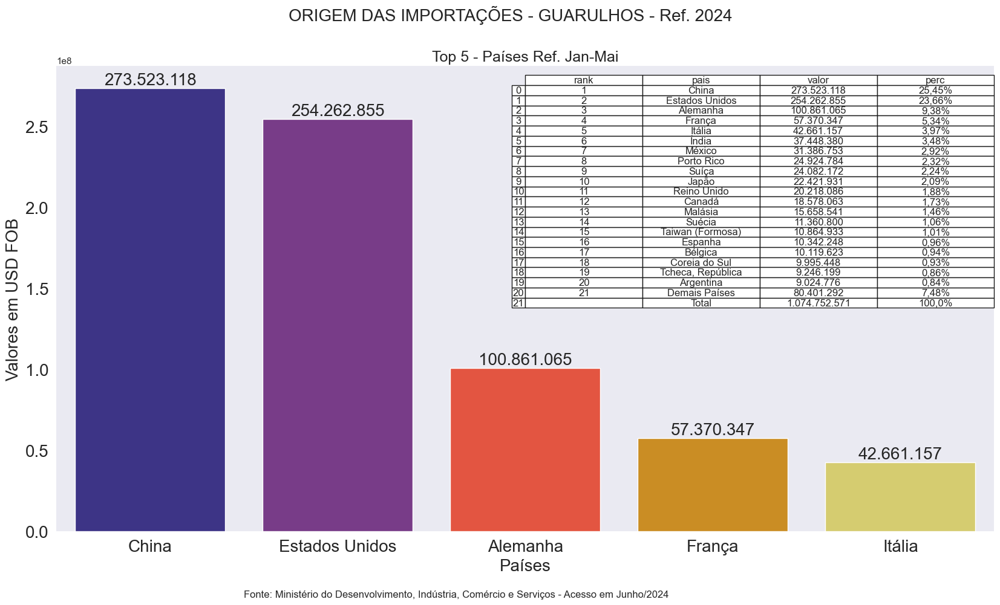

CPU times: total: 1.19 s
Wall time: 1.17 s


In [32]:
%%time

sql_imp = list()

try:
    for i in range(2024, 2025):
            sql_imp.append("""
               with t as (select RANK () OVER (ORDER BY sum(i.vl_fob) DESC) rank, p.nom_pais as pais, i.ano, sum(i.vl_fob) valor
                              from importacao i 
                             inner join municipio m on (i.cod_muni = m.cod_muni) 
                             inner join produto pd on (i.cod_produto = pd.cod_produto) 
                             inner join pais p on (i.cod_pais = p.cod_pais) 
                             where i.ano = {}
                               and i.sg_uf_mun = 'SP' 
                               and i.cod_muni = 3418800 
                               and p.nom_pais not in('Brasil', 'Provisão de Navios e Aeronaves')
                             group by p.nom_pais, i.ano
                             order by 4 desc),
                     tt as (select case when rank > 20 then 21 else rank end rank, case when rank > 20 then 'Demais Países' else pais end pais, ano, valor from t),
                     ff as (select rank, pais, ano, sum(valor) as valor from tt group by rank, pais, ano order by 1),
                     tot as (select cast(sum(valor) as float) as total from ff),     
                     f as (select f.*, round((cast(f.valor as float)/(select * from tot)) * 100., 2) perc from ff f)
                select * from f;
            """.format(i))
            
except Exception as e:
    print(str(e))
    
conn = Connection()
engine = create_engine(conn.current)
paises_imp = list()
try:
    for i in range(0, len(sql_imp)):
        paises_imp.append(pd.read_sql(text(sql_imp[i]), con = engine.connect()))
    
except Exception as e:
    print(str(e))
finally:
    engine.dispose()

for i in range(0, len(paises_imp)):
    paisestable_imp = paises_imp[i].copy()
    paisestable_imp.loc['21'] = pd.Series(['', 'Total', paises_imp[i]['valor'].sum(), round(paises_imp[i]['perc'].sum(),1)], index = ['rank', 'pais', 'valor', 'perc'])
    paisestable_imp['valor'] = paisestable_imp.valor.apply(lambda x: fmti(x))
    paisestable_imp['perc'] = paisestable_imp['perc'].astype(str)
    paisestable_imp['perc'] = paisestable_imp.perc.apply(lambda x: x.replace('.', ',')+'%')
    paisestable_imp.drop(['ano'], axis=1, inplace=True)

    fig, ax = plt.subplots(figsize=(20, 10))
    sns.set_style("whitegrid", {'axes.grid' : False, 'axes.facecolor':'white'})
    sns.despine(bottom = True, left = True)
    ax.grid(False)
    sns.set(style="darkgrid")

    table = plt.table(cellText=paisestable_imp.values, 
                      colWidths=[0.3]*len(paisestable_imp.keys()), 
                      colLabels=paisestable_imp.keys(), 
                      rowLabels=paisestable_imp.index, 
                      cellLoc='center', 
                      rowLoc='center', 
                      bbox=(.5, .48, 0.5, 0.5))

    sns.barplot(ax=ax, data=paises_imp[i][0:5], x='pais', y='valor', palette='CMRmap')
    ax.set_title('Top 5 - Países Ref. {}'.format(ref), size = 18)
    for bars in ax.containers:
        ax.bar_label(bars, fmt=lambda x: "{:,.0f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation = 0, fontsize=20)

    ax.set_xlabel('Países', fontsize = 20)
    ax.set_ylabel('Valores em USD FOB', fontsize = 20)
    
    plt.xticks(rotation=0, fontsize=20)
    plt.yticks(rotation=0, fontsize=20)

    fig.suptitle('ORIGEM DAS IMPORTAÇÕES - GUARULHOS - Ref. {}'.format(ano_ref), size = 20)
    plt.text(.5, -5, "\n\n\n\n\n\n\n\n\n\n\n\nFonte: Ministério do Desenvolvimento, Indústria, Comércio e Serviços - Acesso em {}/{}".format(acesso, ano_ref), ha='left', va='center', fontsize=12)
    plt.show()

CPU times: total: 203 ms
Wall time: 194 ms


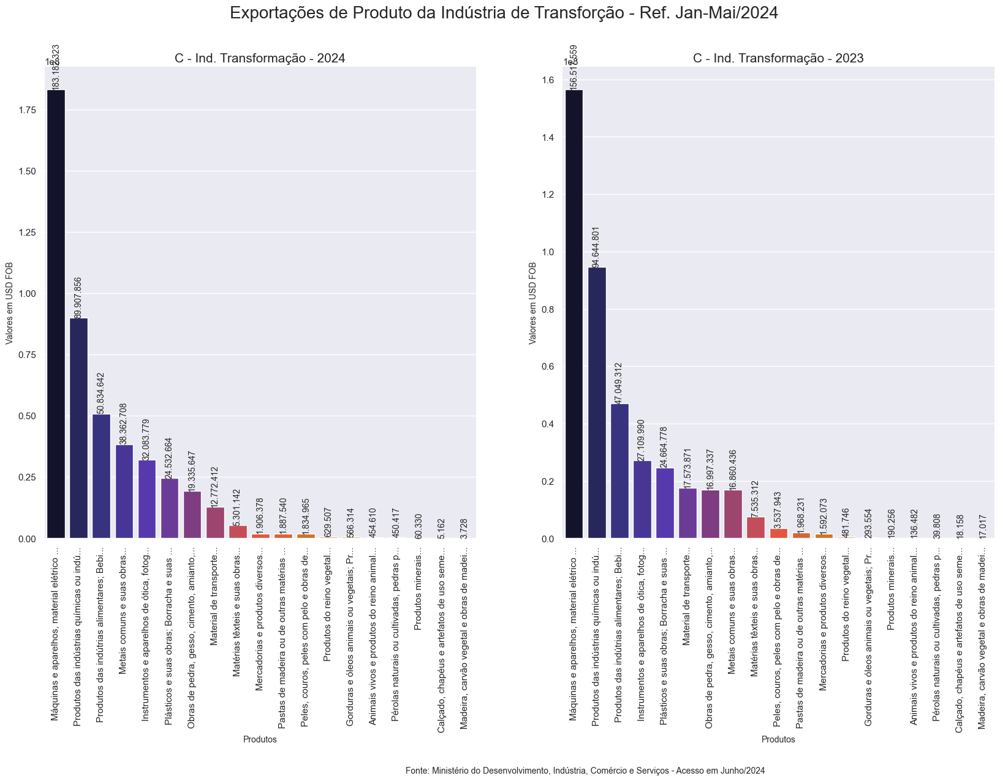

In [34]:
%%time

strconn = Connection()
engine = create_engine(strconn.current)
try:
    sql = ["""
        select np.secao, substring(np.nom_secao, 1, 40) || '...' as nom_secao, e.ano, sum(e.vl_fob) val
          from exportacao e 
         inner join municipio m on (e.cod_muni = m.cod_muni) 
         inner join novoproduto np on (e.cod_produto = np.cod_produto) 
         inner join pais p on (e.cod_pais = p.cod_pais) 
         where e.cod_muni = 3418800 
           and e.ano = {}
           and np.secao = 'C'
           and e.mes <= (select max(mes) from exportacao where ano = {})
         group by np.secao, substring(np.nom_secao, 1, 40) || '...', e.ano
         order by 2;
    """.format(ano_ant, ano_ref), """
        select np.secao, substring(np.nom_secao, 1, 40) || '...' as nom_secao, e.ano, sum(e.vl_fob) val
          from exportacao e 
         inner join municipio m on (e.cod_muni = m.cod_muni) 
         inner join novoproduto np on (e.cod_produto = np.cod_produto) 
         inner join pais p on (e.cod_pais = p.cod_pais) 
         where e.cod_muni = 3418800 
          and e.ano = {}
          and np.secao = 'C'
          and e.mes <= (select max(mes) from exportacao where ano = e.ano)
        group by np.secao, substring(np.nom_secao, 1, 40) || '...', e.ano
        order by 2;
    """.format(ano_ref)]
    d1 = pd.read_sql(text(sql[0]), con = engine.connect())
    d2 = pd.read_sql(text(sql[1]), con = engine.connect())
except Exception as e:
    print(str(e))
finally:
    engine.dispose()
    
outros = d2.merge(d1, how='inner', on=['secao', 'nom_secao'])

fig, axes = plt.subplots(1, 2, figsize=(20, 10))
sns.set(style="darkgrid")

sns.barplot(ax=axes[0], data=outros.query("ano_x == {}".format(ano_ref)).sort_values(by='val_x', ascending=False), x='nom_secao', y='val_x', palette='CMRmap')
axes[0].set_title('C - Ind. Transformação - {}'.format(ano_ref), size = 15)
for bars in axes[0].containers:
    axes[0].bar_label(bars, fmt=lambda x: "{:,.0f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation = 90, fontsize=10)
    
sns.barplot(ax=axes[1], data=outros.query("ano_y == {}".format(ano_ant)).sort_values(by='val_y', ascending=False), x='nom_secao', y='val_y', palette='CMRmap')
axes[1].set_title('C - Ind. Transformação - {}'.format(ano_ant), size = 15)
for bars in axes[1].containers:
    axes[1].bar_label(bars, fmt=lambda x: "{:,.0f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation = 90, fontsize=10)

#fig.subplots_adjust(hspace=0.39, wspace=0.2)
sns.set_style("whitegrid", {'axes.grid' : False, 'axes.facecolor':'white'})
sns.despine(bottom = True, left = True)
ax.grid(False)

axes[0].set_xlabel('Produtos', fontsize = 10)
axes[0].set_ylabel('Valores em USD FOB', fontsize = 10)
axes[1].set_xlabel('Produtos', fontsize = 10)
axes[1].set_ylabel('Valores em USD FOB', fontsize = 10)

axes[0].tick_params(axis='x', rotation=90)
axes[1].tick_params(axis='x', rotation=90)

fig.suptitle('Exportações de Produto da Indústria de Transforção - Ref. {}/{}'.format(ref, ano_ref), size = 20)

ft1 = "\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\nFonte: Ministério do Desenvolvimento, Indústria, Comércio e Serviços - Acesso em {}/{}".format(acesso, ano_ref)
plt.text(.5, .5, ft1, ha='center', va='top', fontsize=10)

fig.show()

CPU times: total: 6.52 s
Wall time: 6.55 s


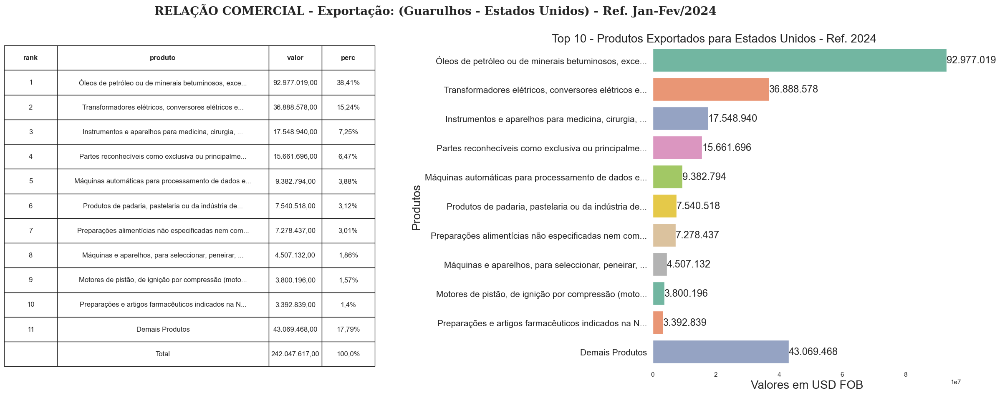

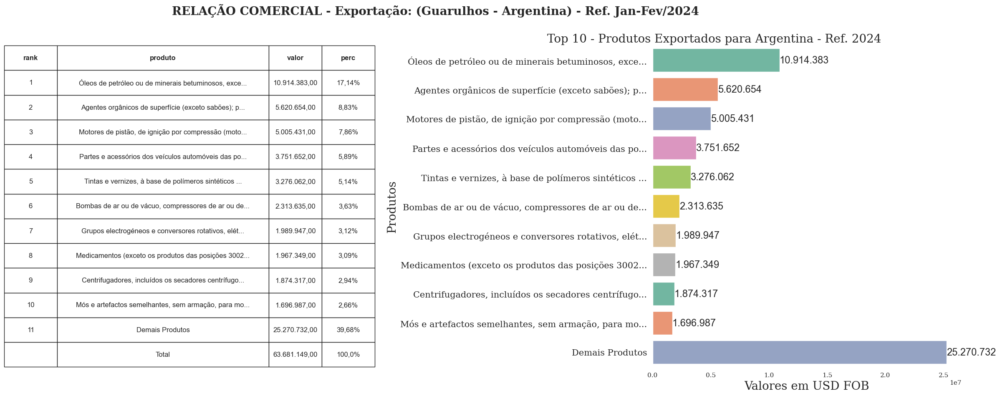

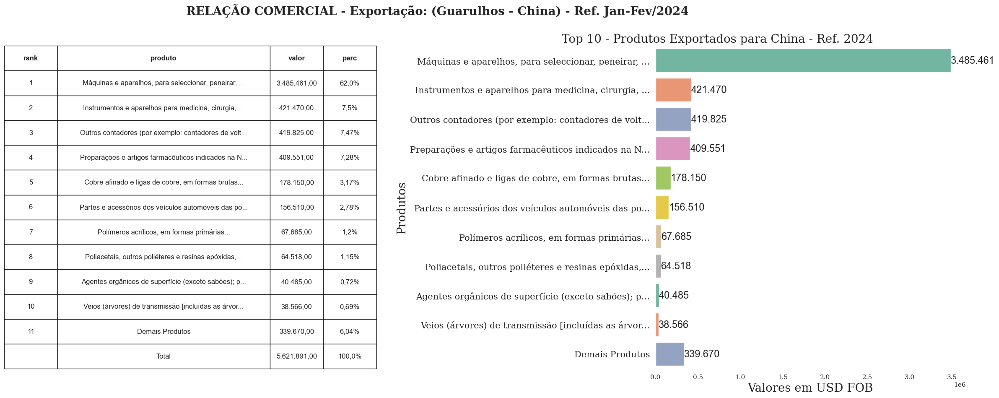

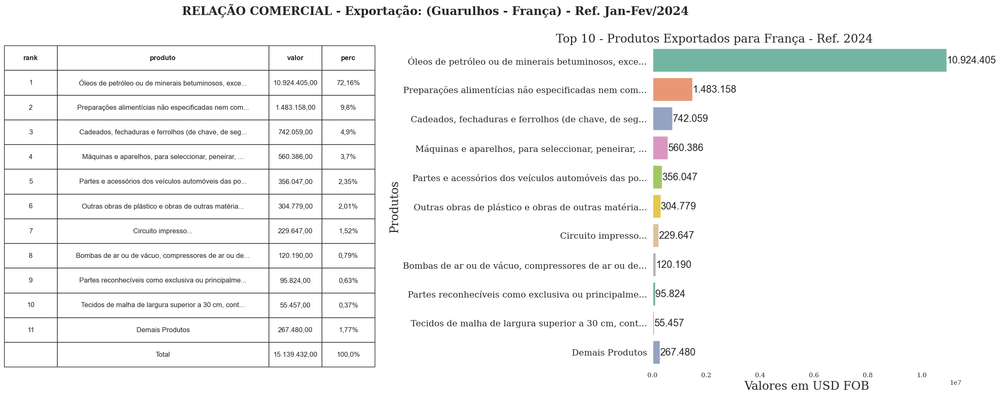

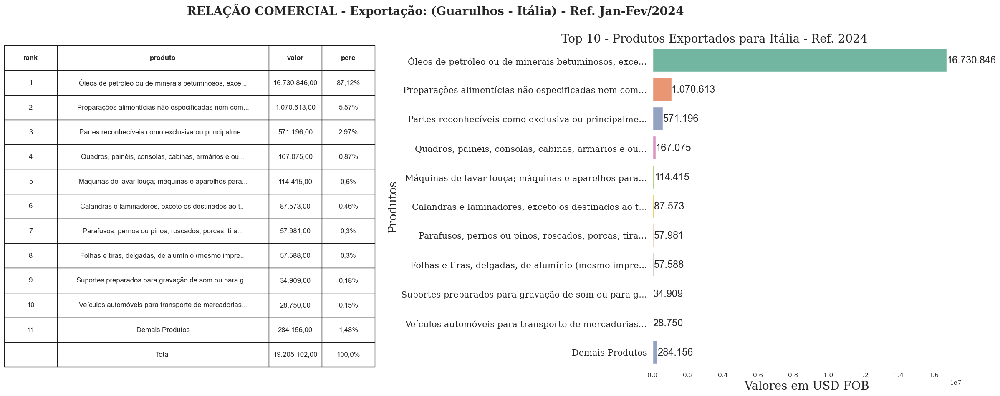

...

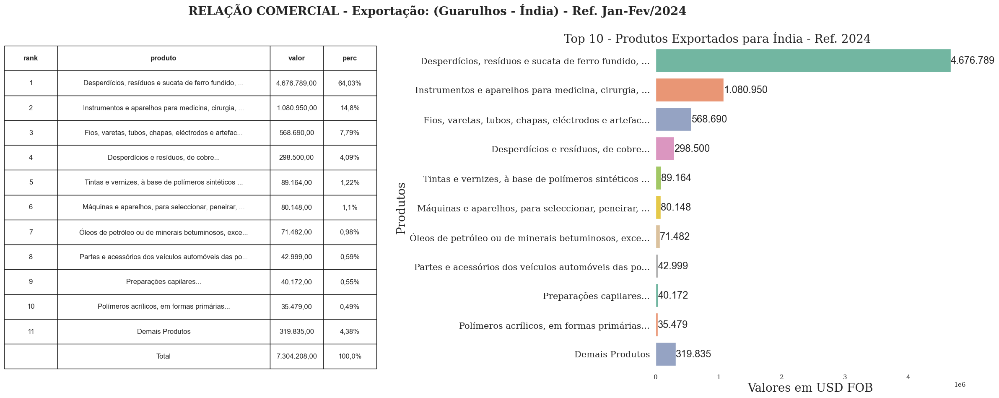

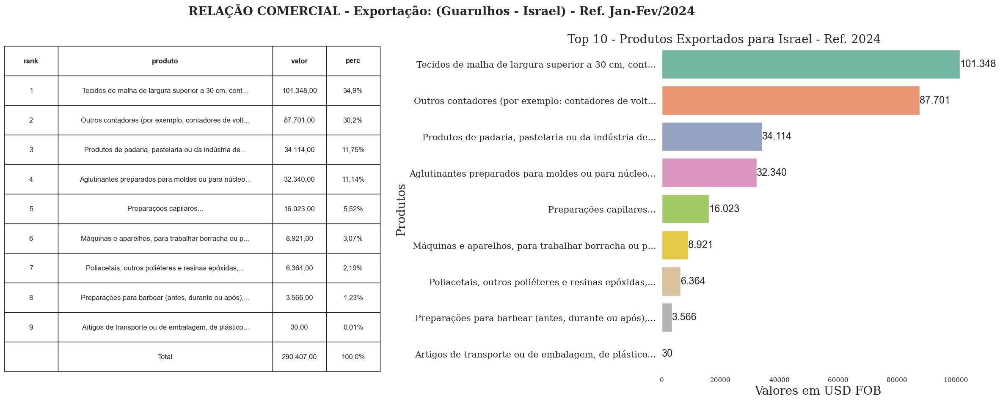

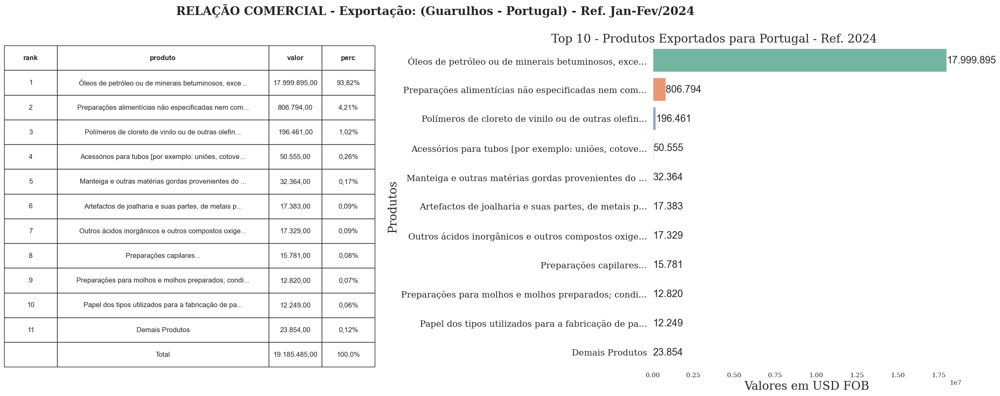

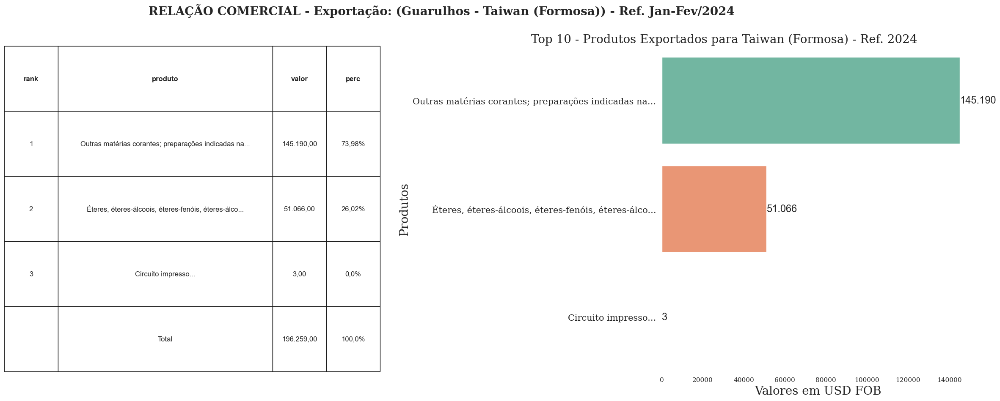

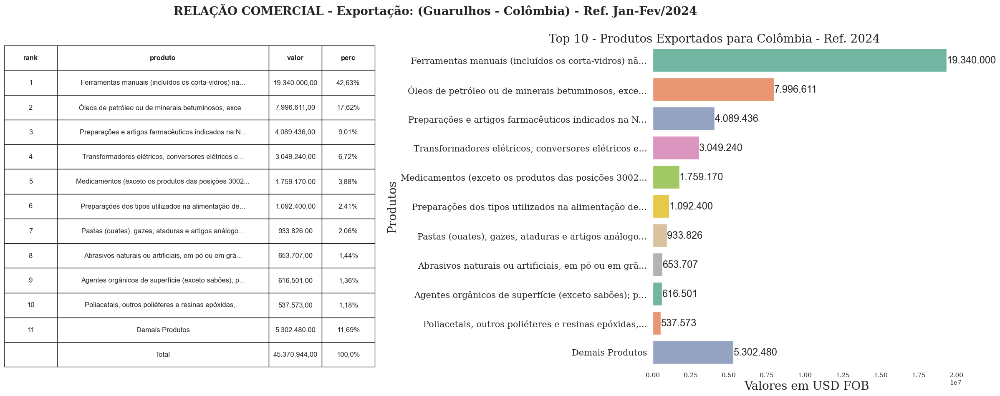

In [35]:
%%time

# EXPORTAÇÃO
pais = {249:'Estados Unidos', 63:'Argentina', 160:'China', 275:'França', 386:'Itália', 23:'Alemanha', 190:'Coréia do Sul', 245:'Espanha', 361:'Índia', 383:'Israel', 607:'Portugal', 161:'Taiwan (Formosa)', 169:'Colômbia'}

for i in pais:
    sql_exp = """
       with t as (select --RANK () OVER (ORDER BY sum(e.vl_fob) DESC) rank, substr(cp.no_isic_divisao, 1, 50) || '...' as produto, e.ano, sum(e.vl_fob) valor
       RANK () OVER (ORDER BY sum(e.vl_fob) DESC) rank, substr(pd.nom_produto, 1, 50) || '...' as produto, e.ano, sum(e.vl_fob) valor
                      from exportacao e 
                     inner join municipio m on (e.cod_muni = m.cod_muni) 
                     inner join produto pd on (e.cod_produto = pd.cod_produto) 
                     where e.ano = {}
                       and e.sg_uf_mun = 'SP' 
                       and e.cod_muni = 3418800 
                       and e.cod_pais = {}
                     group by substr(pd.nom_produto, 1, 50) || '...', e.ano
                     order by 4 desc),
             tt as (select case when rank > 10 then 11 else rank end rank, case when rank > 10 then 'Demais Produtos' else produto end produto, ano, valor from t),
             ff as (select rank, produto, ano, sum(valor) as valor from tt group by rank, produto, ano order by 1),
             tot as (select sum(valor) as total from ff),     
             f as (select f.*, round((cast(f.valor as float)/(select * from tot)) * 100, 2) perc from ff f)
        select * from f;
    """.format(ano_ref, i)
    
    conn = Connection()
    engine = create_engine(conn.current)
    try:
        prod_exp = pd.read_sql(text(sql_exp), con = engine.connect())

    except Exception as e:
        print(str(e))
    finally:
        engine.dispose()

    prodtable_exp = prod_exp.copy()
    prodtable_exp.loc['11'] = pd.Series(['', 'Total', prod_exp['valor'].sum(), round(prod_exp['perc'].sum(),1)], index = ['rank', 'produto', 'valor', 'perc'])
    prodtable_exp['valor'] = prodtable_exp.valor.apply(lambda x: fmt(x))
    prodtable_exp['perc'] = prodtable_exp['perc'].astype(str)
    prodtable_exp['perc'] = prodtable_exp.perc.apply(lambda x: x.replace('.', ',')+'%')
    prodtable_exp.drop(['ano'], axis=1, inplace=True)

    fig, ax = plt.subplots(1, 2, figsize=(21, 10))
    sns.set_style("whitegrid", {'axes.grid' : False, 'axes.facecolor':'white'})
    sns.despine(bottom = True, left = True)
    ax[0].grid(False)
    
    table = plt.table(cellText=prodtable_exp.values, 
                      colWidths=[1]*len(prodtable_exp.keys()), 
                      colLabels=prodtable_exp.keys(), 
                      #rowLabels=prodtable_exp.index, 
                      cellLoc='center', 
                      rowLoc='center', 
                      loc='left',
                      bbox=[-2.1, 0, 1.2, 1]
                     )
    
    table.auto_set_font_size(False)
    table.set_fontsize(12)
    table.auto_set_column_width(-1)
    
    for linha in range(0, prodtable_exp.shape[0]+1):
        for coluna in range(0, prodtable_exp.shape[1]):
            if coluna == 1:
                cell = table[linha, coluna]
                cell.set_width(4)
                
    for (row, col), cell in table.get_celld().items():
        if (row == 0):
            cell.set_text_props(fontproperties=FontProperties(weight='bold'))
    
    ax[0].axis('off')
    
    sns.barplot(ax=ax[1], data=prod_exp, y='produto', x='valor', palette='Set2')
    ax[1].set_title('Top 10 - Produtos Exportados para {} - Ref. {}'.format(pais[i], prod_exp['ano'][0]), size = 20, x=.2)
    for bars in ax[1].containers:
        ax[1].bar_label(bars, fmt=lambda x: "{:,.0f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation = 0, fontsize=17)

    ax[1].set_ylabel('Produtos', fontsize = 20)
    ax[1].set_xlabel('Valores em USD FOB', fontsize = 20)    
    ax[1].tick_params(axis='x', rotation=0)
    ax[1].tick_params(axis='y', rotation=0)
    plt.setp(ax[1].get_yticklabels(), rotation=0, ha="right", rotation_mode="anchor", fontsize=15)
    plt.rcParams['font.family'] = 'Serif'
    fig.suptitle('RELAÇÃO COMERCIAL - Exportação: (Guarulhos - {}) - Ref. Jan-Fev/{}'.format(pais[i], prod_exp['ano'][0]), size = 20, x=.3, fontweight="bold")
    fig.show()

CPU times: total: 10 s
Wall time: 10.1 s


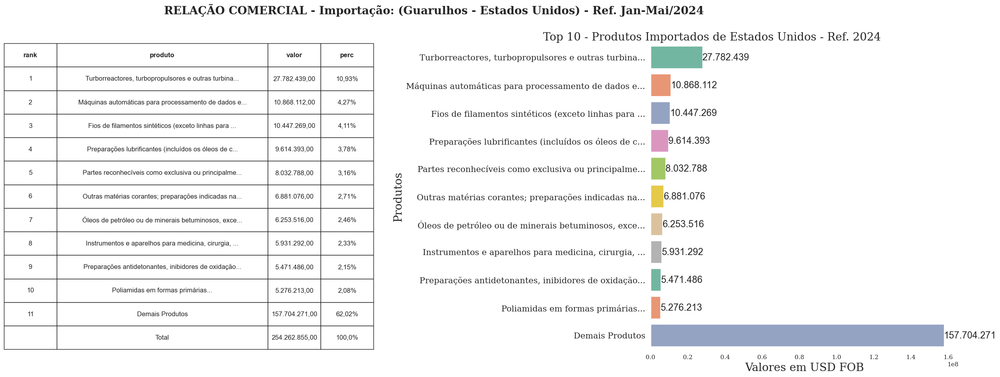

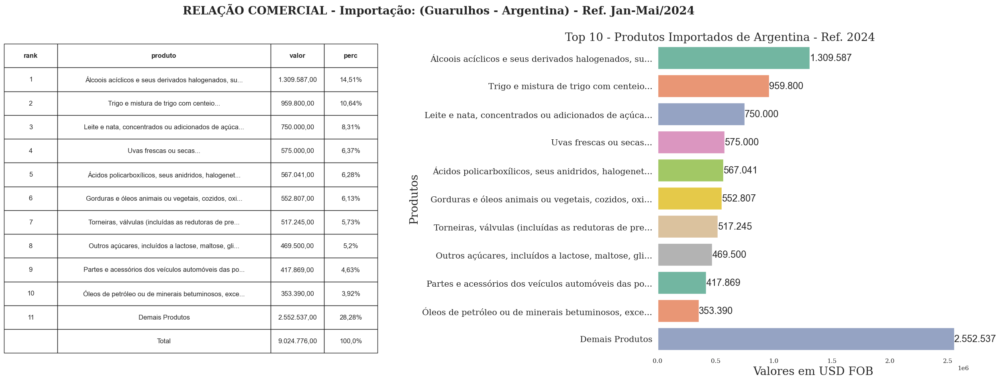

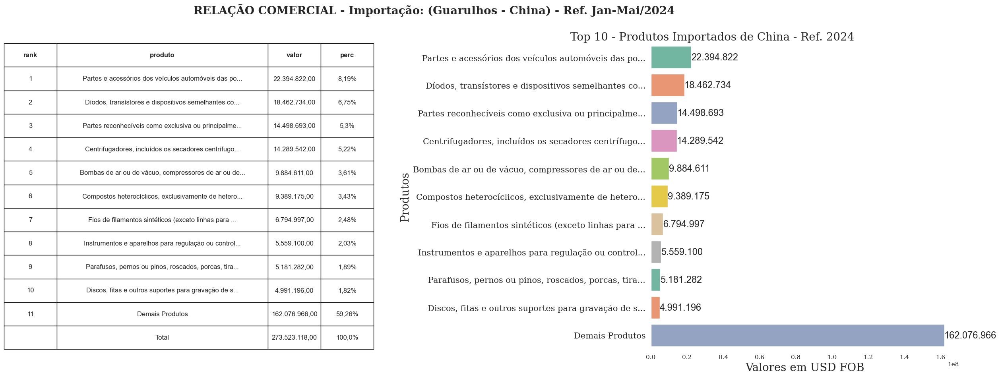

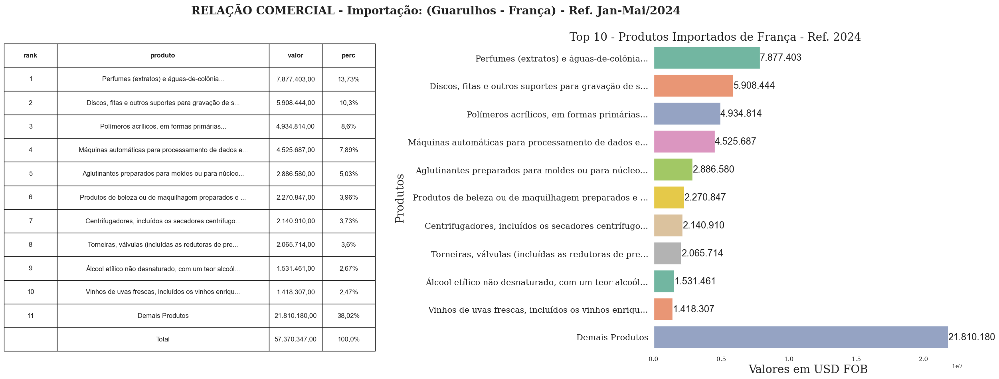

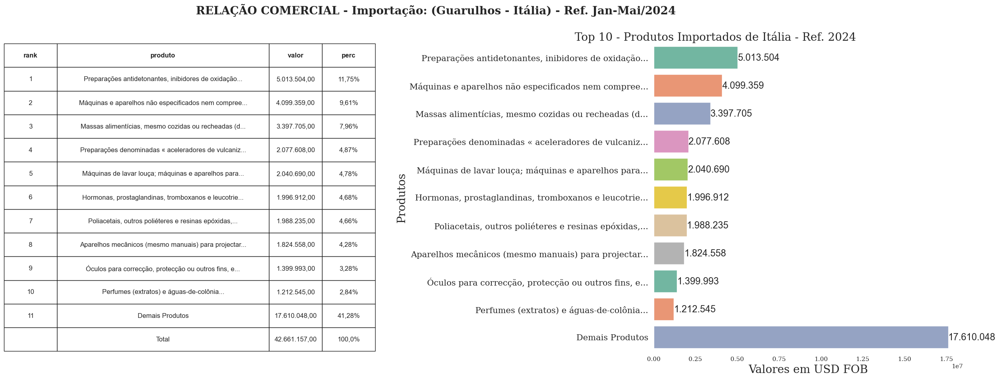

...

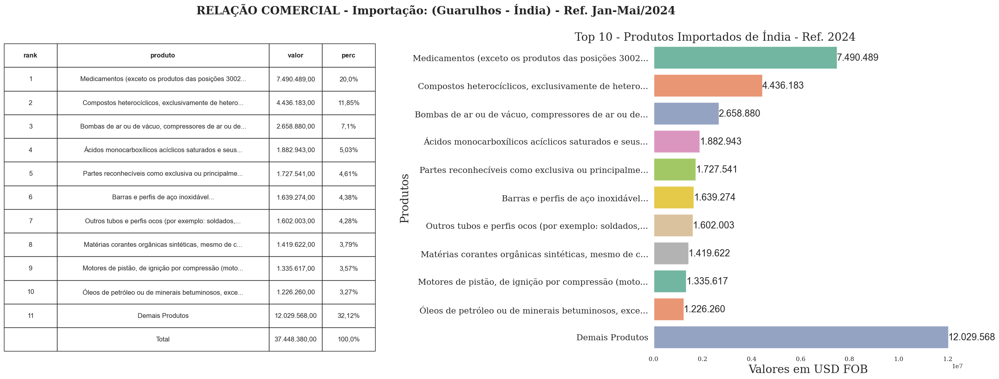

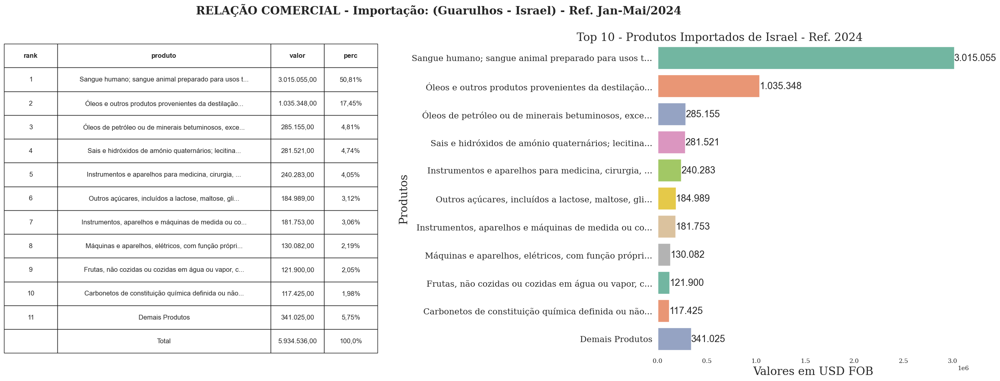

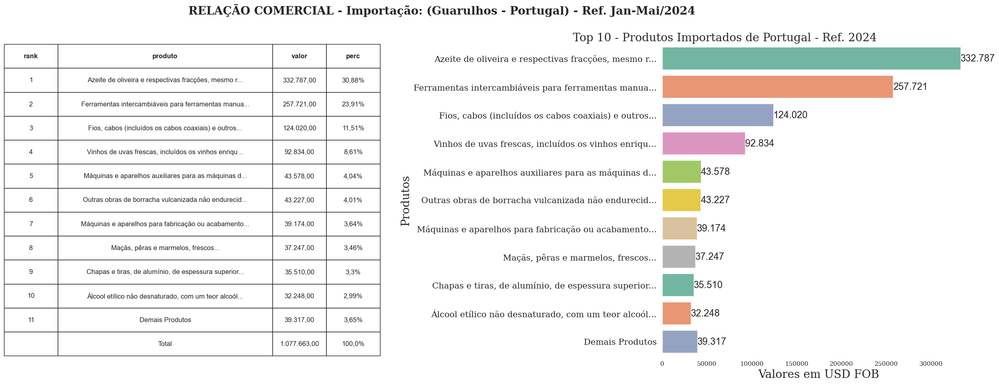

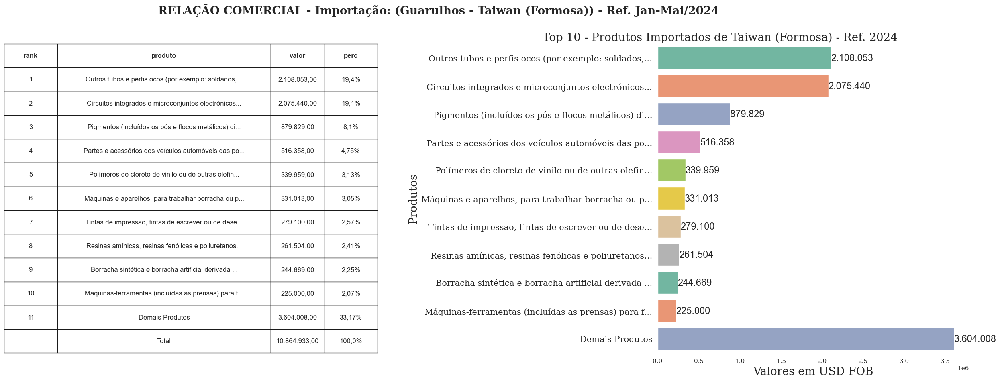

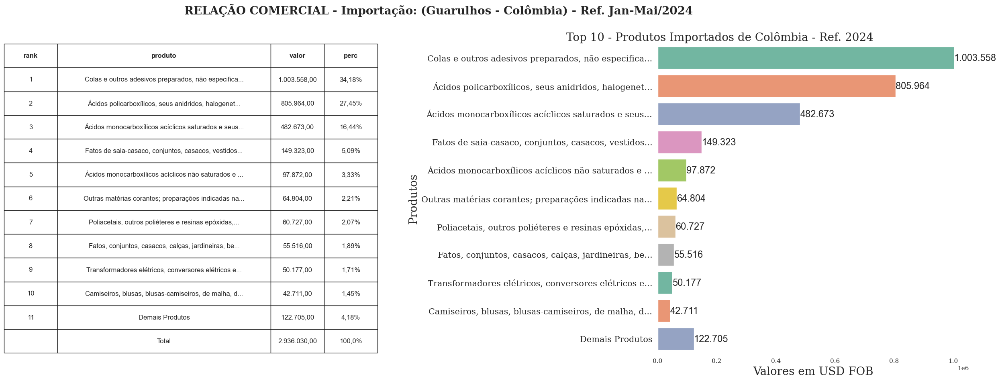

In [36]:
%%time

# IMPORTAÇÃO
pais = {249:'Estados Unidos', 63:'Argentina', 160:'China', 275:'França', 386:'Itália', 23:'Alemanha', 190:'Coréia do Sul', 245:'Espanha', 361:'Índia', 383:'Israel', 607:'Portugal', 161:'Taiwan (Formosa)', 169:'Colômbia'}

for i in pais:
    sql_imp = """
       with t as (select --RANK () OVER (ORDER BY sum(i.vl_fob) DESC) rank, substr(cp.no_isic_divisao, 1, 50) || '...' as produto, i.ano, sum(i.vl_fob) valor
                       RANK () OVER (ORDER BY sum(i.vl_fob) DESC) rank, substr(pd.nom_produto, 1, 50) || '...' as produto, i.ano, sum(i.vl_fob) valor
                      from importacao i 
                     inner join municipio m on (i.cod_muni = m.cod_muni) 
                     inner join produto pd on (i.cod_produto = pd.cod_produto) 
                     --inner join vw_classprod cp on (pd.cod_produto = cp.co_sh4)
                     where i.ano = {}
                       and i.sg_uf_mun = 'SP' 
                       and i.cod_muni = 3418800 
                       and i.cod_pais = {}
                     --group by substr(cp.no_isic_divisao, 1, 50) || '...', i.ano
                     group by substr(pd.nom_produto, 1, 50) || '...', i.ano
                     order by 4 desc),
             tt as (select case when rank > 10 then 11 else rank end rank, case when rank > 10 then 'Demais Produtos' else produto end produto, ano, valor from t),
             ff as (select rank, produto, ano, sum(valor) as valor from tt group by rank, produto, ano order by 1),
             tot as (select sum(valor) as total from ff),     
             f as (select f.*, round((cast(f.valor as float)/(select * from tot)) * 100, 2) perc from ff f)
        select * from f;
    """.format(ano_ref, i)
    
    conn = Connection()
    engine = create_engine(conn.current)
    try:
        prod_imp = pd.read_sql(text(sql_imp), con = engine.connect())

    except Exception as e:
        print(str(e))
    finally:
        engine.dispose()

    prodtable_imp = prod_imp.copy()
    prodtable_imp.loc['11'] = pd.Series(['', 'Total', prod_imp['valor'].sum(), round(prod_imp['perc'].sum(),1)], index = ['rank', 'produto', 'valor', 'perc'])
    prodtable_imp['valor'] = prodtable_imp.valor.apply(lambda x: fmt(x))
    prodtable_imp['perc'] = prodtable_imp['perc'].astype(str)
    prodtable_imp['perc'] = prodtable_imp.perc.apply(lambda x: x.replace('.', ',')+'%')
    prodtable_imp.drop(['ano'], axis=1, inplace=True)

    fig, ax = plt.subplots(1, 2, figsize=(22, 10))
    sns.set_style("whitegrid", {'axes.grid' : False, 'axes.facecolor':'white'})
    sns.despine(bottom = True, left = True)
    ax[0].grid(False)
    
    table = plt.table(cellText=prodtable_imp.values, 
                      colWidths=[1]*len(prodtable_imp.keys()), 
                      colLabels=prodtable_imp.keys(), 
                      #rowLabels=prodtable_exp.index, 
                      cellLoc='center', 
                      rowLoc='center', 
                      loc='left',
                      bbox=[-2.1, 0, 1.2, 1]
                     )
    
    table.auto_set_font_size(False)
    table.set_fontsize(12)
    table.auto_set_column_width(-1)
    
    for linha in range(0, prodtable_imp.shape[0]+1):
        for coluna in range(0, prodtable_imp.shape[1]):
            if coluna == 1:
                cell = table[linha, coluna]
                cell.set_width(4)
                
    for (row, col), cell in table.get_celld().items():
        if (row == 0):
            cell.set_text_props(fontproperties=FontProperties(weight='bold'))
    
    ax[0].axis('off')
    
    sns.barplot(ax=ax[1], data=prod_imp, y='produto', x='valor', palette='Set2')
    ax[1].set_title('Top 10 - Produtos Importados de {} - Ref. {}'.format(pais[i], prod_imp['ano'][0]), size = 20, x=.2)
    for bars in ax[1].containers:
        ax[1].bar_label(bars, fmt=lambda x: "{:,.0f}".format(x).replace(",", "X").replace(".", ",").replace("X", "."), rotation = 0, fontsize=17)

    ax[1].set_ylabel('Produtos', fontsize = 20)
    ax[1].set_xlabel('Valores em USD FOB', fontsize = 20)    
    ax[1].tick_params(axis='x', rotation=0)
    ax[1].tick_params(axis='y', rotation=0)
    plt.setp(ax[1].get_yticklabels(), rotation=0, ha="right", rotation_mode="anchor", fontsize=15)
    plt.rcParams['font.family'] = 'Serif'
    fig.suptitle('RELAÇÃO COMERCIAL - Importação: (Guarulhos - {}) - Ref. {}/{}'.format(pais[i], ref, prod_imp['ano'][0]), size = 20, x=.3, fontweight="bold")
    fig.show()

In [37]:
%%time

###############################################################################################################
##################################### RELAÇÃO COMERCIAL PAÍSES PARCEIROS ######################################
###############################################################################################################

strconn = Connection()
engine = create_engine(strconn.current)
try:
    sql = """
            with data as (select max(mes) mes_atu, max(ano) ano_atu , max(ano)-1 ano_ant
                            from exportacao 
                           where ano = strftime('%Y', date('now'))),
                 impo_atu as (select i.cod_muni, m.nom_muni, m.uf,sum(i.vl_fob) valor, count(*) as qtd
                                from importacao i
                               inner join municipio m on (i.cod_muni = m.cod_muni) 
                               inner join data d on (i.ano = d.ano_atu)
                               group by i.cod_muni, m.nom_muni, m.uf), 
                 impo_ant as (select i.cod_muni, m.nom_muni, m.uf,sum(i.vl_fob) valor, count(*) as qtd
                                from importacao i
                               inner join municipio m on (i.cod_muni = m.cod_muni) 
                               inner join data d on (i.ano = d.ano_ant and i.mes <= d.mes_atu)
                               group by i.cod_muni, m.nom_muni, m.uf),
                 expo_atu as (select e.cod_muni, m.nom_muni, m.uf,sum(e.vl_fob) valor, count(*) as qtd
                                from exportacao e
                               inner join municipio m on (e.cod_muni = m.cod_muni) 
                               inner join data d on (e.ano = d.ano_atu)
                               group by e.cod_muni, m.nom_muni, m.uf),
                 expo_ant as (select e.cod_muni, m.nom_muni, m.uf,sum(e.vl_fob) valor, count(*) as qtd
                                from exportacao e
                               inner join municipio m on (e.cod_muni = m.cod_muni) 
                               inner join data d on (e.ano = d.ano_ant and e.mes <= d.mes_atu)
                               group by e.cod_muni, m.nom_muni, m.uf),
                 imp_rank_pais as (select m.cod_muni, m.uf, sum(i.vl_fob) valor, count(*) as qtd
                                     from importacao i
                                    inner join municipio m on (i.cod_muni = m.cod_muni) 
                                    inner join data d on (i.ano = d.ano_atu)
                                    group by m.cod_muni, m.uf), 
                 exp_rank_pais as (select m.cod_muni, m.uf, sum(e.vl_fob) valor 
                                     from exportacao e
                                    inner join municipio m on (e.cod_muni = m.cod_muni) 
                                    inner join data d on (e.ano = d.ano_atu)
                                    group by m.cod_muni, m.uf),
                 exp_rank_estado as (select * from exp_rank_pais where uf = 'SP'),
                 exp_rank_pf as (select *, rank() over(order by valor desc) as rank from exp_rank_pais),
                 exp_rank_ef as (select *, rank() over(order by valor desc) as rank from exp_rank_estado),
                 imp_rank_estado as (select * from imp_rank_pais where uf = 'SP'),
                 imp_rank_pf as (select *, rank() over(order by valor desc) as rank from imp_rank_pais),
                 imp_rank_ef as (select *, rank() over(order by valor desc) as rank from imp_rank_estado)
            select round((select sum(e.valor)/1000000. from expo_atu e where e.cod_muni = 3418800), 2) as exp,
                   (round((select sum(e.valor) from expo_atu e where e.cod_muni = 3418800)/(select cast(sum(e.valor) as float) from expo_ant e where e.cod_muni = 3418800), 4)-1)*100 as var_exp,
                   round((select sum(i.valor)/1000000. from impo_atu i where i.cod_muni = 3418800), 2) as imp,
                   (round((select sum(e.valor) from impo_atu e where e.cod_muni = 3418800)/(select cast(sum(e.valor) as float) from impo_ant e where e.cod_muni = 3418800), 4)-1)*100 as var_imp,       
                   round(((select sum(e.valor)/1000000. from expo_atu e where e.cod_muni = 3418800) + (select sum(i.valor)/1000000. from impo_atu i where i.cod_muni = 3418800)), 2) as corrente,
                   round(((
                        ((select cast(sum(e.valor) as float) from expo_atu e where e.cod_muni = 3418800) + (select cast(sum(i.valor) as float) from impo_atu i where i.cod_muni = 3418800))/
                        ((select cast(sum(e.valor) as float) from expo_ant e where e.cod_muni = 3418800) + (select cast(sum(i.valor) as float) from impo_ant i where i.cod_muni = 3418800))
                   )-1)*100, 1) as var_corr,
                   round(((select sum(e.valor)/1000000. from expo_atu e where e.cod_muni = 3418800) - (select sum(i.valor)/1000000. from impo_atu i where i.cod_muni = 3418800)), 2) as saldo,
                   round(((select sum(valor) from expo_atu where cod_muni = 3418800) / (select cast(sum(valor) as float) from expo_atu where uf = 'SP')) * 100., 1) as part_exp_estado,
                   round(((select sum(valor) from expo_atu where cod_muni = 3418800) / (select cast(sum(valor) as float) from expo_atu)) * 100, 1) as part_exp_brasil,
                   (select rank from exp_rank_ef where cod_muni = 3418800) rank_exp_estado,
                   (select rank from exp_rank_pf where cod_muni = 3418800) rank_exp_brasil,
                   round(((select sum(valor) from impo_atu where cod_muni = 3418800) / (select cast(sum(valor) as float) from impo_atu where uf = 'SP')) * 100., 1) as part_imp_estado,
                   round(((select sum(valor) from impo_atu where cod_muni = 3418800) / (select cast(sum(valor) as float) from impo_atu)) * 100., 1) as part_imp_brasil,
                   (select rank from imp_rank_ef where cod_muni = 3418800) rank_imp_estado,
                   (select rank from imp_rank_pf where cod_muni = 3418800) rank_imp_brasil;
        """
    df = pd.read_sql(text(sql), con = engine.connect())
except Exception as e:
    print(str(e))
finally:
    engine.dispose()

CPU times: total: 6.33 s
Wall time: 6.37 s


In [38]:
df

,exp,var_exp,imp,var_imp,corrente,var_corr,saldo,part_exp_estado,part_exp_brasil,rank_exp_estado,rank_exp_brasil,part_imp_estado,part_imp_brasil,rank_imp_estado,rank_imp_brasil
0,978.08,-2.2,1076.79,-8.66,2054.87,-5.7,-98.71,3.2,0.7,7,22,3.6,1.0,8,23
